# STATS 4241 Final Project

In [ ]:
import os
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm

from sklearn.preprocessing import StandardScaler, PolynomialFeatures, SplineTransformer
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import train_test_split, KFold, cross_val_score, GridSearchCV
from sklearn.linear_model import LinearRegression, Ridge, LassoCV
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.ensemble import RandomForestRegressor
from sklearn.impute import KNNImputer
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.inspection import permutation_importance, PartialDependenceDisplay

from scipy.stats import boxcox

# Data Acquisition & Preparation

Dataset Link: https://www.kaggle.com/datasets/galibce003/housing-prices-advanced-regression-techniques   
Column Descriptions: https://www.kaggle.com/c/house-prices-advanced-regression-techniques/data


In [ ]:
# Load CSV file
# Uncomment which ever one you have

# file_path = 'Housing_Prices.csv'
# df = pd.read_csv(file_path)

In [ ]:
#import from the source no local file needed
import kagglehub

# Download latest version
path = kagglehub.dataset_download("galibce003/housing-prices-advanced-regression-techniques")
files = os.listdir(path)

full_path = os.path.join(path, files[0])
df = pd.read_csv(full_path)

### Handling missing values

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [ ]:
# Count categorical and numerical columns

categorical_cols = df.select_dtypes(include=['object', 'category']).columns
numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns

categorical_count = len(categorical_cols)
numerical_count = len(numerical_cols)

categorical_count, numerical_count

(43, 38)

This dataset have 43 categorical columns and 38 numerical columns

In [ ]:
def get_missing_data(df):
  # Identify missing values
  missing_counts = df.isnull().sum()
  missing_counts = missing_counts[missing_counts > 0]

  # Split into categorical and numerical missing columns
  categorical_missing = missing_counts[categorical_cols.intersection(missing_counts.index)]
  numerical_missing = missing_counts[numerical_cols.intersection(missing_counts.index)]

  # Print categorical columns with missing values
  categorical_missing = missing_counts[categorical_cols.intersection(missing_counts.index)]
  print("Categorical columns with missing values:")
  print(categorical_missing)

  # Print numerical columns with missing values
  numerical_missing = missing_counts[numerical_cols.intersection(missing_counts.index)]
  print("\nNumerical columns with missing values:")
  print(numerical_missing)

get_missing_data(df)

Categorical columns with missing values:
Alley           1369
MasVnrType       872
BsmtQual          37
BsmtCond          37
BsmtExposure      38
BsmtFinType1      37
BsmtFinType2      38
Electrical         1
FireplaceQu      690
GarageType        81
GarageFinish      81
GarageQual        81
GarageCond        81
PoolQC          1453
Fence           1179
MiscFeature     1406
dtype: int64

Numerical columns with missing values:
LotFrontage    259
MasVnrArea       8
GarageYrBlt     81
dtype: int64


In [ ]:
df.shape

(1460, 81)

There are 1460 observations in this dataset.    
Drop columns that have missing more than 20% of total observations

In [ ]:
# Drop columns with more than 250 missing values
missing_counts = df.isnull().sum()
missing_counts = missing_counts[missing_counts > 0]

# Identify columns with more than 250 missing values
columns_to_drop = missing_counts[missing_counts > 250].index

# Drop those columns from the DataFrame
df_cleaned = df.drop(columns=columns_to_drop)

# Show remaining shape of the DataFrame
# show column label of dropped column
df_cleaned.shape, columns_to_drop.tolist()


((1460, 74),
 ['LotFrontage',
  'Alley',
  'MasVnrType',
  'FireplaceQu',
  'PoolQC',
  'Fence',
  'MiscFeature'])

In [ ]:
get_missing_data(df_cleaned)

Categorical columns with missing values:
BsmtQual        37
BsmtCond        37
BsmtExposure    38
BsmtFinType1    37
BsmtFinType2    38
Electrical       1
GarageType      81
GarageFinish    81
GarageQual      81
GarageCond      81
dtype: int64

Numerical columns with missing values:
MasVnrArea      8
GarageYrBlt    81
dtype: int64


By observation, the missing values of GarageType, GarageFinish, GarageQual, GarageCond, GarageYrBlt are all 81.   
Connecting with real life, some house do not have Garages.   


In [ ]:
# Find the ID of houses that have missing values in all 5 columns
garage_all_cols = ['GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'GarageYrBlt']
missing_garage = df_cleaned[df_cleaned[garage_all_cols].isnull().all(axis=1)]
matching_ids = missing_garage['Id'].tolist()
num_matching = missing_garage.shape[0]

print("ID of houses that have missing values in all 5  garage columns are :")
print(matching_ids)
print("\nCount number of ID:", num_matching)

ID of houses that have missing values in all 5  garage columns are :
[40, 49, 79, 89, 90, 100, 109, 126, 128, 141, 149, 156, 164, 166, 199, 211, 242, 251, 288, 292, 308, 376, 387, 394, 432, 435, 442, 465, 496, 521, 529, 534, 536, 563, 583, 614, 615, 621, 636, 637, 639, 650, 706, 711, 739, 751, 785, 827, 844, 922, 943, 955, 961, 969, 971, 977, 1010, 1012, 1031, 1039, 1097, 1124, 1132, 1138, 1144, 1174, 1180, 1219, 1220, 1235, 1258, 1284, 1324, 1326, 1327, 1338, 1350, 1408, 1450, 1451, 1454]

Count number of ID: 81


There are exactly 81 houses missing garage infomation.    
Let's check their bult years and other information about garage, such as "GarageCars" and "GarageArea"

In [ ]:
# Find their garage information
columns_to_show = ['Id', 'YearBuilt', 'GarageType', 'GarageFinish',
                   'GarageQual', 'GarageCond', 'GarageYrBlt', 'GarageCars', 'GarageArea']

garage_info_df = df_cleaned[df_cleaned['Id'].isin(matching_ids)][columns_to_show]

pd.set_option('display.max_rows', None)
print(garage_info_df)


        Id  YearBuilt GarageType GarageFinish GarageQual GarageCond  \
39      40       1955        NaN          NaN        NaN        NaN   
48      49       1920        NaN          NaN        NaN        NaN   
78      79       1968        NaN          NaN        NaN        NaN   
88      89       1915        NaN          NaN        NaN        NaN   
89      90       1994        NaN          NaN        NaN        NaN   
99     100       1959        NaN          NaN        NaN        NaN   
108    109       1919        NaN          NaN        NaN        NaN   
125    126       1935        NaN          NaN        NaN        NaN   
127    128       1930        NaN          NaN        NaN        NaN   
140    141       1971        NaN          NaN        NaN        NaN   
148    149       2004        NaN          NaN        NaN        NaN   
155    156       1924        NaN          NaN        NaN        NaN   
163    164       1956        NaN          NaN        NaN        NaN   
165   

From this table, we can infer that these houses do not have a garage.

In [ ]:
def column_fill_helper(df, lst_col, fill_value):
  for col in lst_col:
      df[col] = df[col].fillna(fill_value)


In [ ]:
# Filling in all garage categorical columns with missing values into "None"

garage_cat_cols = ['GarageType', 'GarageFinish', 'GarageQual', 'GarageCond']

column_fill_helper(df_cleaned, garage_cat_cols,'None')

For the column "GarageYrBlt", considering it is a numerical column, if we simply put 0s in the missing value space, it will have a huge influence in our model. I decided to use the same number as their 'YearBuilt'.

In [ ]:
df_cleaned['GarageYrBlt'] = df_cleaned['GarageYrBlt'].fillna(df_cleaned['YearBuilt'])

By observation, there are around 37 houses missing the information of basement relating information 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2'. It is also reasonable that not every house has basement.   
Let's check.

In [ ]:
bsmt_cols = ['BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2']


bsmt_missing = df_cleaned[df_cleaned[bsmt_cols].isnull().any(axis=1)]


bsmt_missing = df_cleaned[df_cleaned[bsmt_cols].isnull().all(axis=1)]

bsmt_missing_ids = bsmt_missing['Id'].tolist()
num_bsmt_missing = len(bsmt_missing_ids)

bsmt_missing_ids, num_bsmt_missing
print("ID of houses that have missing values in all basement 5 columns are :")
print(bsmt_missing_ids)
print("\nCount number of ID:", num_bsmt_missing)

ID of houses that have missing values in all basement 5 columns are :
[18, 40, 91, 103, 157, 183, 260, 343, 363, 372, 393, 521, 533, 534, 554, 647, 706, 737, 750, 779, 869, 895, 898, 985, 1001, 1012, 1036, 1046, 1049, 1050, 1091, 1180, 1217, 1219, 1233, 1322, 1413]

Count number of ID: 37


In [ ]:
bsmt_detail_cols = [
    'Id', 'BsmtQual', 'BsmtCond', 'BsmtExposure',
    'BsmtFinType1', 'BsmtFinSF1',
    'BsmtFinType2', 'BsmtFinSF2',
    'BsmtUnfSF', 'TotalBsmtSF'
]


bsmt_detail_df = df_cleaned[df_cleaned['Id'].isin(bsmt_missing_ids)][bsmt_detail_cols]

bsmt_detail_df


,Id,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF
17,18,NaN,NaN,NaN,NaN,0,NaN,0,0,0
39,40,NaN,NaN,NaN,NaN,0,NaN,0,0,0
90,91,NaN,NaN,NaN,NaN,0,NaN,0,0,0
102,103,NaN,NaN,NaN,NaN,0,NaN,0,0,0
156,157,NaN,NaN,NaN,NaN,0,NaN,0,0,0
182,183,NaN,NaN,NaN,NaN,0,NaN,0,0,0
259,260,NaN,NaN,NaN,NaN,0,NaN,0,0,0
342,343,NaN,NaN,NaN,NaN,0,NaN,0,0,0
362,363,NaN,NaN,NaN,NaN,0,NaN,0,0,0
371,372,NaN,NaN,NaN,NaN,0,NaN,0,0,0


From these relating information, these house do not have a basement.    
Replacing all the missing data with "None" since they are categorical data.

In [ ]:
# Filling all the missing data with "None" to those 37 houses that does not have basements
for col in bsmt_cols:
    df_cleaned.loc[df_cleaned['Id'].isin(bsmt_missing_ids), col] = 'None'


'BsmtExposure' and 'BsmtFinType2' has 38 missing values, and we fill in 37.   
Try to find the information about the left missing values.

check the the missing value of column 'BsmtExposure' and its basement information

In [ ]:
bsmt_exposure_missing = df_cleaned[df_cleaned['BsmtExposure'].isnull()]
bsmt_exposure_detail_df = bsmt_exposure_missing[bsmt_detail_cols]
bsmt_exposure_detail_df

,Id,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF
948,949,Gd,TA,NaN,Unf,0,Unf,0,936,936


check the the missing value of column 'BsmtFinType2' and its basement information

In [ ]:
bsmt_exposure_missing = df_cleaned[df_cleaned['BsmtFinType2'].isnull()]
bsmt_exposure_detail_df = bsmt_exposure_missing[bsmt_detail_cols]
bsmt_exposure_detail_df

,Id,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF
332,333,Gd,TA,No,GLQ,1124,NaN,479,1603,3206


These two missing values are applicable to use KNN to fill in.

Find information about 8 'MasVnrArea' missing values

In [ ]:
# Becasue'MasVnrType' column was deleted, it is necessary to check the original dataset find relations of two Mansonry columns
MasVnrArea_missing_df = df[df['MasVnrArea'].isnull()][['Id', 'MasVnrType', 'MasVnrArea']]
MasVnrArea_missing_df

,Id,MasVnrType,MasVnrArea
234,235,NaN,NaN
529,530,NaN,NaN
650,651,NaN,NaN
936,937,NaN,NaN
973,974,NaN,NaN
977,978,NaN,NaN
1243,1244,NaN,NaN
1278,1279,NaN,NaN


There is no relations that can be easily find, so they are also missing values needing to be filled in by KNN method.

Check the missing value of column 'Electrical'

In [ ]:
Electrical_missing_df = df[df['Electrical'].isnull()][['Id', 'Electrical']]
Electrical_missing_df

,Id,Electrical
1379,1380,NaN


In [ ]:
get_missing_data(df_cleaned)

Categorical columns with missing values:
BsmtExposure    1
BsmtFinType2    1
Electrical      1
dtype: int64

Numerical columns with missing values:
MasVnrArea    8
dtype: int64


As of now, there are 11 missing values as listed.  
Including 3 categorical values, they belong to column 'BsmtExposure','BsmtFinType2','Electrical'
Including 8 numerical values, they belong to column 'MasVnrArea'
Try to use KNN method to fill in the 11 missing values.   

In [ ]:
# create a new copy dataframe df_cleaned
df_KNN = df_cleaned.copy()

# Keep ID, make sure this column is not standardedized
id_col = df_KNN['Id']
numerical_cols = df_KNN.select_dtypes(include=['int64', 'float64']).columns.drop('Id')

# Standardize numerical columns
scaler = StandardScaler()
df_KNN[numerical_cols] = scaler.fit_transform(df_KNN[numerical_cols])

# Add Id column back
df_KNN['Id'] = id_col

# One-Hot encoding on categorical columns
categorical_cols = df_KNN.select_dtypes(include=['object', 'category']).columns
df_KNN = pd.get_dummies(df_KNN, columns=categorical_cols, drop_first=True)


# Use 5-NN method to impute df_KNN
imputer = KNNImputer(n_neighbors=5)
df_KNN_array = imputer.fit_transform(df_KNN)

# df_KNN is a dataset with all categorical columns roughly dummmy encoded and all numerical columns standardized
df_KNN = pd.DataFrame(df_KNN_array, columns=df_KNN.columns)


In [ ]:
df_KNN.head()

,Id,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_None,BsmtQual_TA,BsmtCond_Gd,BsmtCond_None,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtExposure_None,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_None,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_None,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_None,GarageFinish_None,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Fa,GarageQual_Gd,GarageQual_None,GarageQual_Po,GarageQual_TA,GarageCond_Fa,GarageCond_Gd,GarageCond_None,GarageCond_Po,GarageCond_TA,PavedDrive_P,PavedDrive_Y,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,1.0,0.073375,-0.207142,0.651479,-0.517200,1.050994,0.878668,0.510015,0.575425,-0.288653,-0.944591,-0.459303,-0.793434,1.161852,-0.120242,0.370333,1.107810,-0.241061,0.789741,1.227585,0.163779,-0.211454,0.912210,-0.951226,1.007405,0.

Handle the 8 missing value in column 'MasVnrArea'

In [ ]:
MasVnrArea_missing_Id = df_cleaned[df_cleaned['MasVnrArea'].isnull()][['Id']]
MasVnrArea_missing_Id

,Id
234,235
529,530
650,651
936,937
973,974
977,978
1243,1244
1278,1279


In [ ]:
# inverse standardize value of df_KNN 'MasVnrArea' column, then fill them into missing values of df_cleaned
missing_ids = MasVnrArea_missing_Id['Id'].tolist()
masvnr_std_values = df_KNN[df_KNN['Id'].isin(missing_ids)]['MasVnrArea'].values.reshape(-1, 1)
masvnr_scaler = StandardScaler()
masvnr_scaler.fit(df_cleaned[['MasVnrArea']].dropna())
masvnr_recovered = masvnr_scaler.inverse_transform(masvnr_std_values).flatten()

# fill in the missing value in df_cleaned
for id_val, recovered_val in zip(missing_ids, masvnr_recovered):
    df_cleaned.loc[df_cleaned['Id'] == id_val, 'MasVnrArea'] = recovered_val


In [ ]:
# check the values being filled in
filled_df = pd.DataFrame({
    'Id': missing_ids,
    'Recovered_MasVnrArea': masvnr_recovered
})

print(filled_df)

     Id  Recovered_MasVnrArea
0   235                 304.2
1   530                 216.2
2   651                 157.2
3   937                  42.0
4   974                  21.2
5   978                  63.2
6  1244                  73.0
7  1279                 104.6


In [ ]:
def cat_find_fill(df, column, id, fill_value):
  # find Id  value of column
  row = df[df['Id'] == id]

  # find column relating One-Hot encoding
  cols = [col for col in df.columns if col.startswith(f'{column}_')]

  for col in cols:
      if row[col].values[0] == 1:
          print(f"Id = {id}  category of {column} is: {col.split('_')[1]}")
          break
  else:
      print(f"Id = {id} category of {column} is {fill_value}")

  # Double check Id
  pd.set_option('display.max_columns', None)
  pd.set_option('display.width', None)

  return df[df['Id'] == id]


In [ ]:
# find and fill id 949 value of 'BsmtExposure'
cat_find_fill(df_KNN,'BsmtExposure',949,'Av')


Id = 949 category of BsmtExposure is Av


,Id,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_None,BsmtQual_TA,BsmtCond_Gd,BsmtCond_None,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtExposure_None,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_None,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_None,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_None,GarageFinish_None,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Fa,GarageQual_Gd,GarageQual_None,GarageQual_Po,GarageQual_TA,GarageCond_Fa,GarageCond_Gd,GarageCond_None,GarageCond_Po,GarageCond_TA,PavedDrive_P,PavedDrive_Y,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
948,949.0,0.073375,0.349692,0.651479,-0.5172,1.017873,0.830215,0.222729,-0.973018,-0.288653,0.834835,-0.276885,-0.586424,1.129769,-0.120242,0.495976,-0.819964,-0.241061,0.789741,1.227585,0.163779,-0.211454,0.296763,0.600495,0.969379,0

In [ ]:
# fill in df_clean
df_cleaned.loc[df_cleaned['Id'] == 949, 'BsmtExposure'] = 'Av'

In [ ]:
# find and fill id 333 value of 'BsmtFinType2'
cat_find_fill(df_KNN,'BsmtFinType2',333,'ALQ')


Id = 333 category of BsmtFinType2 is ALQ


,Id,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_None,BsmtQual_TA,BsmtCond_Gd,BsmtCond_None,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtExposure_None,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_None,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_None,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_None,GarageFinish_None,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Fa,GarageQual_Gd,GarageQual_None,GarageQual_Po,GarageQual_TA,GarageCond_Fa,GarageCond_Gd,GarageCond_None,GarageCond_Po,GarageCond_TA,PavedDrive_P,PavedDrive_Y,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
332,333.0,-0.872563,0.013848,1.374795,-0.5172,1.050994,0.927122,1.06249,1.492208,2.681632,2.344856,4.899204,1.206797,-0.795163,-0.120242,0.216136,1.10781,-0.241061,0.789741,-0.761621,0.163779,-0.211454,0.296763,0.600495,1.007405,1.650

In [ ]:
# fill in df_clean
df_cleaned.loc[df_cleaned['Id'] == 333, 'BsmtFinType2'] = 'ALQ'

In [ ]:
# find and fill id 1380 value of 'Electrical'
cat_find_fill(df_KNN,'Electrical',1380,'FuseA')

Id = 1380 category of Electrical is FuseA


,Id,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_None,BsmtQual_TA,BsmtCond_Gd,BsmtCond_None,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtExposure_None,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_None,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_None,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_None,GarageFinish_None,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Fa,GarageQual_Gd,GarageQual_None,GarageQual_Po,GarageQual_TA,GarageCond_Fa,GarageCond_Gd,GarageCond_None,GarageCond_Po,GarageCond_TA,PavedDrive_P,PavedDrive_Y,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
1379,1380.0,0.546344,-0.078356,-0.795151,-0.5172,1.150356,1.072482,-0.572835,-0.973018,-0.288653,-0.414838,-1.535564,-1.057371,0.671452,-0.120242,-0.231227,-0.819964,-0.241061,0.789741,1.227585,0.163779,-0.211454,0.296763,-0.951226,1.

In [ ]:
df_cleaned.loc[df_cleaned['Id'] == 1380, 'Electrical'] = 'FuseA'

In [ ]:
get_missing_data(df_cleaned)

Categorical columns with missing values:
Series([], dtype: int64)

Numerical columns with missing values:
Series([], dtype: int64)


There are no missing value in df_cleaned

### check if there are any inconsistencies or formatting issues

In [ ]:
categorical_cols_cleaned = df_cleaned.select_dtypes(include=['object', 'category']).columns
numerical_cols_cleaned = df_cleaned.select_dtypes(include=['int64', 'float64']).columns

categorical_count_cleaned = len(categorical_cols_cleaned)
numerical_count_cleaned = len(numerical_cols_cleaned)

categorical_count_cleaned, numerical_count_cleaned

(37, 37)

In [ ]:
print("Check if there are any inconsistent or formatting issues in categorical columns:\n")

for col in categorical_cols_cleaned:
    print(f"\n{col} - unique values:")
    print(sorted(df_cleaned[col].dropna().unique()))

Check if there are any inconsistent or formatting issues in categorical columns:


MSZoning - unique values:
['C (all)', 'FV', 'RH', 'RL', 'RM']

Street - unique values:
['Grvl', 'Pave']

LotShape - unique values:
['IR1', 'IR2', 'IR3', 'Reg']

LandContour - unique values:
['Bnk', 'HLS', 'Low', 'Lvl']

Utilities - unique values:
['AllPub', 'NoSeWa']

LotConfig - unique values:
['Corner', 'CulDSac', 'FR2', 'FR3', 'Inside']

LandSlope - unique values:
['Gtl', 'Mod', 'Sev']

Neighborhood - unique values:
['Blmngtn', 'Blueste', 'BrDale', 'BrkSide', 'ClearCr', 'CollgCr', 'Crawfor', 'Edwards', 'Gilbert', 'IDOTRR', 'MeadowV', 'Mitchel', 'NAmes', 'NPkVill', 'NWAmes', 'NoRidge', 'NridgHt', 'OldTown', 'SWISU', 'Sawyer', 'SawyerW', 'Somerst', 'StoneBr', 'Timber', 'Veenker']

Condition1 - unique values:
['Artery', 'Feedr', 'Norm', 'PosA', 'PosN', 'RRAe', 'RRAn', 'RRNe', 'RRNn']

Condition2 - unique values:
['Artery', 'Feedr', 'Norm', 'PosA', 'PosN', 'RRAe', 'RRAn', 'RRNn']

BldgType - unique values

Going through all unique values in categorical columns, there do not have two unique values have the same meaning but in different formats.

In [ ]:
# check datatypes for numerical columns
columns_not_categorical = df_cleaned.columns.difference(categorical_cols_cleaned)
non_cat_df = df_cleaned[columns_not_categorical]
def is_numeric_dtype(col):
    return pd.api.types.is_numeric_dtype(col)

dtype_check = df_cleaned[columns_not_categorical].apply(is_numeric_dtype)

print(dtype_check)

1stFlrSF         True
2ndFlrSF         True
3SsnPorch        True
BedroomAbvGr     True
BsmtFinSF1       True
BsmtFinSF2       True
BsmtFullBath     True
BsmtHalfBath     True
BsmtUnfSF        True
EnclosedPorch    True
Fireplaces       True
FullBath         True
GarageArea       True
GarageCars       True
GarageYrBlt      True
GrLivArea        True
HalfBath         True
Id               True
KitchenAbvGr     True
LotArea          True
LowQualFinSF     True
MSSubClass       True
MasVnrArea       True
MiscVal          True
MoSold           True
OpenPorchSF      True
OverallCond      True
OverallQual      True
PoolArea         True
SalePrice        True
ScreenPorch      True
TotRmsAbvGrd     True
TotalBsmtSF      True
WoodDeckSF       True
YearBuilt        True
YearRemodAdd     True
YrSold           True
dtype: bool


The datatype of all non-categorical columns are numerical

In [ ]:
# check if there is any duplicate housing information
has_duplicates = df_cleaned.duplicated().any()
print("Has duplicate rows:", has_duplicates)

Has duplicate rows: False


In [ ]:
# check again without the 'Id' column to make sure there no houses with same information but has different IDs
has_duplicates_excl_id = df_cleaned.duplicated(subset=df_cleaned.columns.difference(['Id'])).any()
print("Has duplicate rows (excluding 'Id'):", has_duplicates_excl_id)

Has duplicate rows (excluding 'Id'): False


There are no inconsistencies and formating issue here.

Moving forward, dataframe 'df_cleaned' is the dataset we will use.

# Exploratory Data Analysis & Feature Engineering & Preprocessing

In [ ]:
df_cleaned.shape

(1460, 74)

There are 1460 observations and 74 features in the cleaned dataset.

In [ ]:
df_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 74 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotArea        1460 non-null   int64  
 4   Street         1460 non-null   object 
 5   LotShape       1460 non-null   object 
 6   LandContour    1460 non-null   object 
 7   Utilities      1460 non-null   object 
 8   LotConfig      1460 non-null   object 
 9   LandSlope      1460 non-null   object 
 10  Neighborhood   1460 non-null   object 
 11  Condition1     1460 non-null   object 
 12  Condition2     1460 non-null   object 
 13  BldgType       1460 non-null   object 
 14  HouseStyle     1460 non-null   object 
 15  OverallQual    1460 non-null   int64  
 16  OverallCond    1460 non-null   int64  
 17  YearBuilt      1460 non-null   int64  
 18  YearRemo

In [ ]:
print(f"Number of categorical columns: {categorical_count_cleaned}")
print(f"Number of numerical columns: {numerical_count_cleaned}")

Number of categorical columns: 37
Number of numerical columns: 37


In [ ]:
df_cleaned.head(10)

,Id,MSSubClass,MSZoning,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,0,2,2008,WD,Normal,208500
1,2,20,RL,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,0,5,2007,WD,Normal,181500
2,3,60,RL,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,0,9,2008,WD,Normal,223500
3,4,70,RL,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,0,2,2006,WD,Abnorml,140000
4,5,60,RL,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,0,12,2008,WD,Normal,250000
5,6,50,RL,14115,Pave,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,700,10,2009,WD,Normal,143000
6,7,20,RL,10084,Pave,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Attchd,2004.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,0,8,2007,WD,Normal,307000
7,8,60,RL,10382,Pave,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,350,11,2009,WD,Normal,200000
8,9,50,RM,6120,Pave,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,Detchd,1931.0,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,0,4,2008,WD,Abnorml,129900
9,10,190,RL,7420,Pave,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,5,6,1939,1950,Gable,CompShg,MetalSd,MetalSd,0.0,TA,TA,BrkTil,TA,TA,No,GLQ,851,Unf,0,140,991,GasA,Ex,Y,SBrkr,1077,0,0,1077,1,0,1,0,2,2,TA,5,Typ,2,Attchd,1939.0,RFn,1,205,Gd,TA,Y,0,4,0,0,0,0,0,1,2008,WD,Normal,118000


## Categorical Data Analysis

In [ ]:
# create a dataframe only have Categorical columns
categorical_df = df_cleaned.select_dtypes(include=['object']).drop(columns=['Id'], errors='ignore')

In [ ]:
# check if all columns are Categorical
is_all_categorical = categorical_df.dtypes.apply(lambda x: np.issubdtype(x, 'object')).all()
print("Is entire df_cleaned categorical only?:", is_all_categorical)

Is entire df_cleaned categorical only?: True


In [ ]:
categorical_df.shape

(1460, 37)

### Histgram and KDE for Categorical

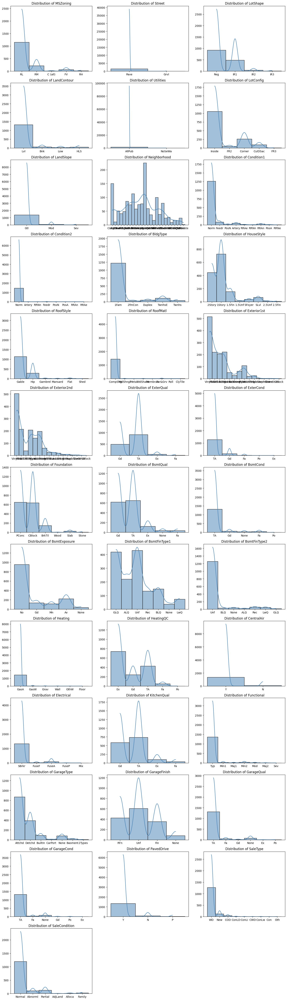

In [ ]:
n_cols = 3
n_total = len(categorical_df.columns)
n_rows = math.ceil(n_total / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))
axes = axes.flatten()

for i, col in enumerate(categorical_df.columns):
    sns.histplot(data=categorical_df, x=col, kde=True, ax=axes[i], color='steelblue')
    axes[i].set_title(f'Distribution of {col}')
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


### Inspect features for balanced contribution
If a feature has 95% or more observations in one category then its impact on the prediction is minimal.

In [ ]:
#Create a list of features that are to unbalanced
unbal_lis=[]
for col in categorical_df:
  temp=categorical_df[col].value_counts(normalize=True)
  for i in range(len(temp.values)):
    if temp.values[i]>=0.95:
      unbal_lis.append(temp)

# Getting the names of the columns to be removed
unbal_col_names=[]
for _ in unbal_lis:
  unbal_col_names.append(_.index.name)
unbal_col_names

['Street', 'Utilities', 'Condition2', 'RoofMatl', 'Heating']

In [ ]:
categorical_df_bal=categorical_df.drop(columns=unbal_col_names)
categorical_df_bal.shape

(1460, 32)

If feature category has 5% or less contribution to feature then merge into combined category 'other'

In [ ]:
#we can decide to toggle this if necessary
threshold=0.05
categorical_df_bal_merge=categorical_df_bal.copy()

for col in categorical_df_bal_merge.columns:
  dist = categorical_df_bal_merge[col].value_counts(normalize=True)
  cat_keep= dist[dist>threshold].index

  categorical_df_bal_merge[col]=categorical_df_bal_merge[col].apply(lambda x:
                                                               x if x in cat_keep
                                                               else 'Other')

for col in categorical_df_bal_merge.columns:
  print(categorical_df_bal_merge[col].value_counts(normalize=True))

MSZoning
RL       0.788356
RM       0.149315
Other    0.062329
Name: proportion, dtype: float64
LotShape
Reg      0.633562
IR1      0.331507
Other    0.034932
Name: proportion, dtype: float64
LandContour
Lvl      0.897945
Other    0.102055
Name: proportion, dtype: float64
LotConfig
Inside     0.720548
Corner     0.180137
CulDSac    0.064384
Other      0.034932
Name: proportion, dtype: float64
LandSlope
Gtl      0.946575
Other    0.053425
Name: proportion, dtype: float64
Neighborhood
Other      0.380822
NAmes      0.154110
CollgCr    0.102740
OldTown    0.077397
Edwards    0.068493
Somerst    0.058904
Gilbert    0.054110
NridgHt    0.052740
Sawyer     0.050685
Name: proportion, dtype: float64
Condition1
Norm     0.863014
Other    0.081507
Feedr    0.055479
Name: proportion, dtype: float64
BldgType
1Fam      0.835616
Other     0.086301
TwnhsE    0.078082
Name: proportion, dtype: float64
HouseStyle
1Story    0.497260
2Story    0.304795
1.5Fin    0.105479
Other     0.092466
Name: proportio

How much did we reduce the feature space?


In [ ]:
dummies_before = pd.get_dummies(categorical_df_bal, drop_first=False)
dummies_after = pd.get_dummies(categorical_df_bal_merge, drop_first=False)

print(f"Original feature space: {dummies_before.shape[1]} columns")
print(f"Reduced feature space:  {dummies_after.shape[1]} columns")

reduction = dummies_before.shape[1] - dummies_after.shape[1]
print(f"↓ Reduced by: {reduction} columns ({(reduction / dummies_before.shape[1]) * 100:.2f}%)")

Original feature space: 213 columns
Reduced feature space:  118 columns
↓ Reduced by: 95 columns (44.60%)


In [ ]:
categorical_df_bal_merge.head()

,MSZoning,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,BldgType,HouseStyle,RoofStyle,Exterior1st,Exterior2nd,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition
0,RL,Reg,Lvl,Inside,Gtl,CollgCr,Norm,1Fam,2Story,Gable,VinylSd,VinylSd,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,Ex,Y,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
1,RL,Reg,Lvl,Other,Gtl,Other,Feedr,1Fam,1Story,Gable,MetalSd,MetalSd,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,Ex,Y,SBrkr,TA,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
2,RL,IR1,Lvl,Inside,Gtl,CollgCr,Norm,1Fam,2Story,Gable,VinylSd,VinylSd,Gd,TA,PConc,Gd,TA,Mn,GLQ,Unf,Ex,Y,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
3,RL,IR1,Lvl,Corner,Gtl,Other,Norm,1Fam,2Story,Gable,Wd Sdng,Other,TA,TA,BrkTil,TA,Other,No,ALQ,Unf,Gd,Y,SBrkr,Gd,Typ,Detchd,Unf,TA,TA,Y,WD,Abnorml
4,RL,IR1,Lvl,Other,Gtl,Other,Norm,1Fam,2Story,Gable,VinylSd,VinylSd,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,Ex,Y,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal


In [ ]:
dummies_after.head()

,MSZoning_Other,MSZoning_RL,MSZoning_RM,LotShape_IR1,LotShape_Other,LotShape_Reg,LandContour_Lvl,LandContour_Other,LotConfig_Corner,LotConfig_CulDSac,LotConfig_Inside,LotConfig_Other,LandSlope_Gtl,LandSlope_Other,Neighborhood_CollgCr,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_NAmes,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_Other,Neighborhood_Sawyer,Neighborhood_Somerst,Condition1_Feedr,Condition1_Norm,Condition1_Other,BldgType_1Fam,BldgType_Other,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1Story,HouseStyle_2Story,HouseStyle_Other,RoofStyle_Gable,RoofStyle_Hip,RoofStyle_Other,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_Other,Exterior1st_Plywood,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior2nd_HdBoard,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,ExterQual_Gd,ExterQual_Other,ExterQual_TA,ExterCond_Gd,ExterCond_Other,ExterCond_TA,Foundation_BrkTil,Foundation_CBlock,Foundation_Other,Foundation_PConc,BsmtQual_Ex,BsmtQual_Gd,BsmtQual_Other,BsmtQual_TA,BsmtCond_Other,BsmtCond_TA,BsmtExposure_Av,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtExposure_Other,BsmtFinType1_ALQ,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Other,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_Other,BsmtFinType2_Unf,HeatingQC_Ex,HeatingQC_Gd,HeatingQC_Other,HeatingQC_TA,CentralAir_N,CentralAir_Y,Electrical_FuseA,Electrical_Other,Electrical_SBrkr,KitchenQual_Ex,KitchenQual_Gd,KitchenQual_Other,KitchenQual_TA,Functional_Other,Functional_Typ,GarageType_Attchd,GarageType_BuiltIn,GarageType_Detchd,GarageType_None,GarageType_Other,GarageFinish_Fin,GarageFinish_None,GarageFinish_RFn,GarageFinish_Unf,GarageQual_None,GarageQual_Other,GarageQual_TA,GarageCond_None,GarageCond_Other,GarageCond_TA,PavedDrive_N,PavedDrive_Other,PavedDrive_Y,SaleType_New,SaleType_Other,SaleType_WD,SaleCondition_Abnorml,SaleCondition_Normal,SaleCondition_Other,SaleCondition_Partial
0,False,True,False,False,False,True,True,False,False,False,True,False,True,False,True,False,False,False,False,False,False,False,False,False,True,False,True,False,False,False,False,True,False,True,False,False,False,False,False,False,True,False,False,False,False,False,True,False,True,False,False,False,False,True,False,False,False,True,False,True,False,False,False,True,False,False,False,True,False,False,False,True,False,False,False,False,False,True,True,False,False,False,False,True,False,False,True,False,True,False,False,False,True,True,False,False,False,False,False,False,True,False,False,False,True,False,False,True,False,False,True,False,False,True,False,True,False,False
1,False,True,False,False,False,True,True,False,False,False,False,True,True,False,False,False,False,False,False,False,True,False,False,True,False,False,True,False,False,False,True,False,False,True,False,False,False,True,False,False,False,False,False,True,False,False,False,False,False,False,True,False,False,True,False,True,False,False,False,True,False,False,False,True,False,True,False,False,False,True,False,False,False,False,False,False,False,True,True,False,False,False,False,True,False,False,True,False,False,False,True,False,True,True,False,False,False,False,False,False,True,False,False,False,True,False,False,True,False,False,True,False,False,True,False,True,False,False
2,False,True,False,True,False,False,True,False,False,False,True,False,True,False,True,False,False,False,False,False,False,False,False,False,True,False,True,False,False,False,False,True,False,True,False,False,False,False,False,False,True,False,False,False,False,False,True,False,True,False,False,False,False,True,False,False,False,True,False,True,False,False,False,True,False,False,True,False,False,False,False,True,False,False,False,False,False,True,True,False,False,False,False,True,False,False,True,False,True,False,False,False,True,True,False,False,False,False,False,False,True,False,False,False,True,False,False,True,False,False,True,False,False,True,False,True,False,False
3,F

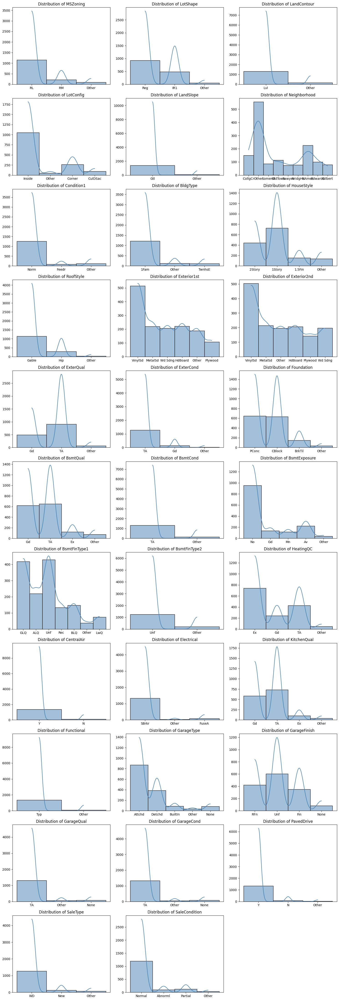

In [ ]:
n_cols = 3
n_total = len(categorical_df_bal_merge.columns)
n_rows = math.ceil(n_total / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))
axes = axes.flatten()

for i, col in enumerate(categorical_df_bal_merge.columns):
    sns.histplot(data=categorical_df_bal_merge, x=col, kde=True, ax=axes[i], color='steelblue')
    axes[i].set_title(f'Distribution of {col}')
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


### Numerical Data Analysis

In [ ]:
# create a dataframe only have numerical columns
numerical_df = df_cleaned.select_dtypes(include=['int64', 'float64']).drop(columns=['Id'], errors='ignore')

In [ ]:
numerical_df.describe()

,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,56.897260,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.789452,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1976.507534,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,42.300571,9981.264932,1.382997,1.112799,30.202904,20.645407,180.699838,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,26.306739,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,20.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1872.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,20.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1959.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,50.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1978.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,70.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2001.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,190.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


### Boxplot for numerical data

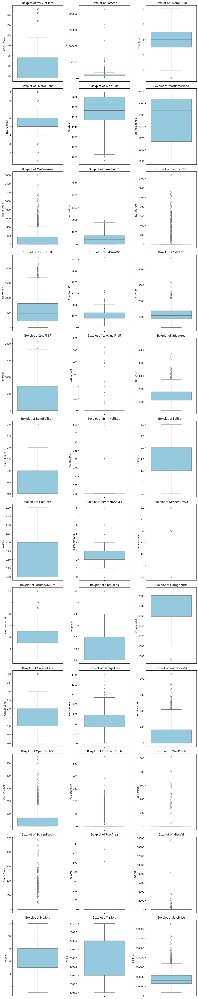

In [ ]:
n_cols = 3
n_total = len(numerical_df.columns)
n_rows = math.ceil(n_total / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 4, n_rows * 5))
axes = axes.flatten()

for i, col in enumerate(numerical_df.columns):
    sns.boxplot(y=numerical_df[col], ax=axes[i], color='skyblue')
    axes[i].set_title(f'Boxplot of {col}')
    axes[i].set_xlabel('')
    axes[i].set_ylabel(col)

for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

### Histgram and KDE

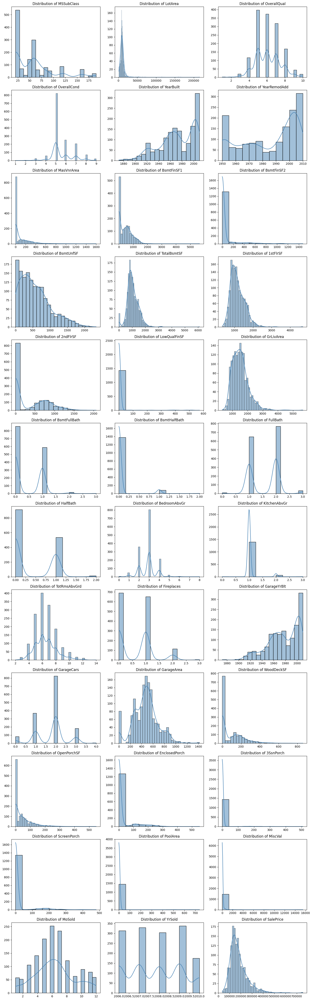

In [ ]:
n_cols = 3
n_total = len(numerical_df.columns)
n_rows = math.ceil(n_total / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))
axes = axes.flatten()

for i, col in enumerate(numerical_df.columns):
    sns.histplot(data=numerical_df, x=col, kde=True, ax=axes[i], color='steelblue')
    axes[i].set_title(f'Distribution of {col}')
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

From histogram and KDE, 'GrLivArea' and '1stFlrSF' are a little bit right skew.  
Use Box-Cox to make them closer to normal distribution.

In [ ]:
# Transform by using Box-Cox
numerical_df = numerical_df.copy()


boxcox_lambdas = {}


cols_to_transform = ['GrLivArea', '1stFlrSF']

for col in cols_to_transform:
    if (numerical_df[col] <= 0).any():
        shift = abs(numerical_df[col].min()) + 1
        numerical_df[col] = numerical_df[col] + shift
        print(f"Column '{col}' shifted by {shift} before Box-Cox transform.")

    transformed_col, fitted_lambda = boxcox(numerical_df[col])

    numerical_df[col] = transformed_col

    boxcox_lambdas[col] = fitted_lambda

    print(f"Box-Cox lambda for '{col}': {fitted_lambda:.4f}")


Box-Cox lambda for 'GrLivArea': 0.0063
Box-Cox lambda for '1stFlrSF': -0.0788


### Pairplot of numerical variables
pick top 5 that has highest correlation with our response variable SalePrice

In [ ]:
# find top 5 variables most corrleated with SalePrice
correlations = numerical_df.corr()['SalePrice'].drop('SalePrice')
top5 = correlations.reindex(correlations.abs().sort_values(ascending=False).index).head(5)
print("Top 5 variables most correlated with SalePrice:")
print(top5)

Top 5 variables most correlated with SalePrice:
OverallQual    0.790982
GrLivArea      0.695364
GarageCars     0.640409
GarageArea     0.623431
TotalBsmtSF    0.613581
Name: SalePrice, dtype: float64


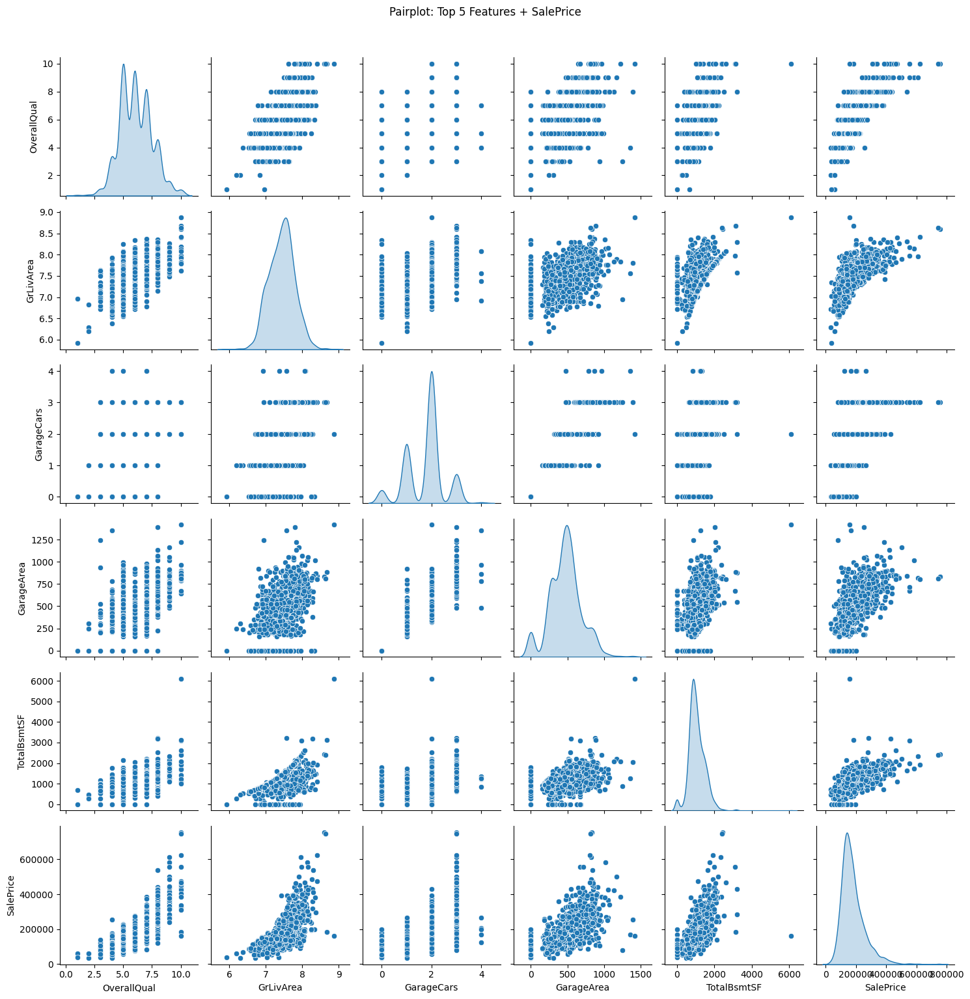

In [ ]:
correlations = numerical_df.corr()['SalePrice'].drop('SalePrice')
top5_vars = correlations.abs().sort_values(ascending=False).head(5).index.tolist()

selected_vars = top5_vars + ['SalePrice']
sub_df = numerical_df[selected_vars]

sns.pairplot(sub_df, diag_kind='kde')
plt.suptitle("Pairplot: Top 5 Features + SalePrice", y=1.02)
plt.tight_layout()
plt.show()

### Correlation Matrix

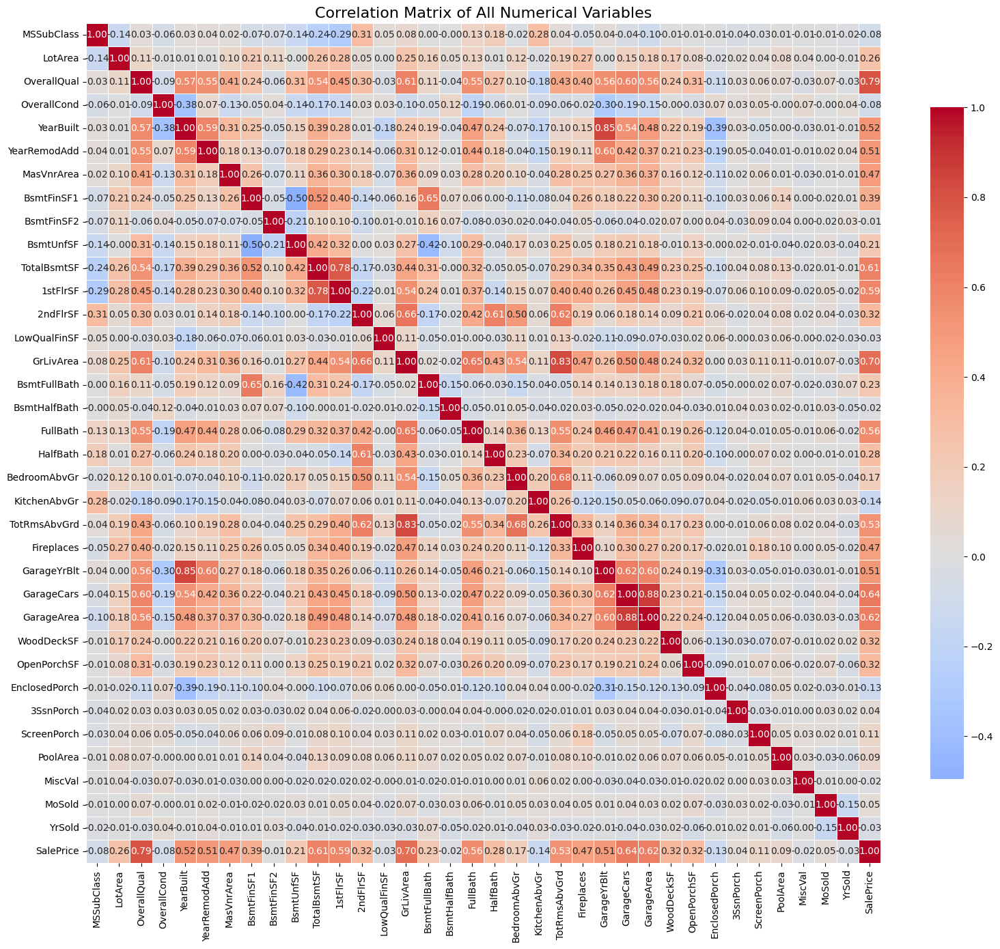

In [ ]:
corr_matrix = numerical_df.corr()

plt.figure(figsize=(16, 14))

sns.heatmap(
    corr_matrix,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    center=0,
    linewidths=0.5,
    cbar_kws={"shrink": 0.8}
)

plt.title("Correlation Matrix of All Numerical Variables", fontsize=16)
plt.tight_layout()
plt.show()

In [ ]:
# Print all combination that correlation >= 0.80
corr_matrix = numerical_df.corr().abs()
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

high_corr_pairs = (
    upper.stack()
    .reset_index()
    .rename(columns={0: 'Correlation', 'level_0': 'Variable 1', 'level_1': 'Variable 2'})
)

high_corr_pairs = high_corr_pairs[high_corr_pairs['Correlation'] >= 0.80]

print("Highly correlated variable pairs (correlation ≥ 0.80):")
high_corr_sorted=high_corr_pairs.sort_values(by='Correlation', ascending=False)
print(high_corr_sorted)


Highly correlated variable pairs (correlation ≥ 0.80):
     Variable 1    Variable 2  Correlation
564  GarageCars    GarageArea     0.882475
152   YearBuilt   GarageYrBlt     0.845141
405   GrLivArea  TotRmsAbvGrd     0.825686


Since we will run LASSO in the later part and it can remove the colinearity in this model, let's take a close look at these pairs after we run LASSO.

### Standardization

In [ ]:
scaler = StandardScaler()
scaled_array = scaler.fit_transform(numerical_df)
numerical_df_standard = pd.DataFrame(scaled_array, columns=numerical_df.columns, index=numerical_df.index)

### Merge categorical data and numerical data

In [ ]:
dummies_encoding2 = pd.get_dummies(categorical_df_bal_merge, drop_first=True).astype(int)

In [ ]:
# Combine categorical and numerical dataframe
df_standardized = pd.concat([numerical_df_standard.reset_index(drop=True),
                         dummies_encoding2.reset_index(drop=True)], axis=1)
df_standardized.head(10)

,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice,MSZoning_RL,MSZoning_RM,LotShape_Other,LotShape_Reg,LandContour_Other,LotConfig_CulDSac,LotConfig_Inside,LotConfig_Other,LandSlope_Other,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_NAmes,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_Other,Neighborhood_Sawyer,Neighborhood_Somerst,Condition1_Norm,Condition1_Other,BldgType_Other,BldgType_TwnhsE,HouseStyle_1Story,HouseStyle_2Story,HouseStyle_Other,RoofStyle_Hip,RoofStyle_Other,Exterior1st_MetalSd,Exterior1st_Other,Exterior1st_Plywood,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,ExterQual_Other,ExterQual_TA,ExterCond_Other,ExterCond_TA,Foundation_CBlock,Foundation_Other,Foundation_PConc,BsmtQual_Gd,BsmtQual_Other,BsmtQual_TA,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtExposure_Other,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Other,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_Unf,HeatingQC_Gd,HeatingQC_Other,HeatingQC_TA,CentralAir_Y,Electrical_Other,Electrical_SBrkr,KitchenQual_Gd,KitchenQual_Other,KitchenQual_TA,Functional_Typ,GarageType_BuiltIn,GarageType_Detchd,GarageType_None,GarageType_Other,GarageFinish_None,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Other,GarageQual_TA,GarageCond_Other,GarageCond_TA,PavedDrive_Other,PavedDrive_Y,SaleType_Other,SaleType_WD,SaleCondition_Normal,SaleCondition_Other,SaleCondition_Partial
0,0.073375,-0.207142,0.651479,-0.517200,1.050994,0.878668,0.510472,0.575425,-0.288653,-0.944591,-0.459303,-0.799591,1.161852,-0.120242,0.528505,1.107810,-0.241061,0.789741,1.227585,0.163779,-0.211454,0.912210,-0.951226,1.007405,0.311725,0.351000,-0.752176,0.216503,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,-1.599111,0.138777,0.347273,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,1,1,0,0,1,0,0,0,0,0,1,0,0,1,0,1,0,1,0,1,1,0,0
1,-0.872563,-0.091886,-0.071836,2.179628,0.156734,-0.429577,-0.574572,1.171992,-0.288653,-0.641228,0.466465,0.429125,-0.795163,-0.120242,-0.382746,-0.819964,3.948809,0.789741,-0.761621,0.163779,-0.211454,-0.318683,0.600495,-0.019300,0.311725,-0.060731,1.626195,-0.704483,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,-0.489110,-0.614439,0.007288,1,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,1,1,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,1,1,0,0,0,0,0,1,0,0,1,0,1,0,1,0,1,1,0,0
2,0.073375,0.073480,0.651479,-0.517200,0.984752,0.830215,0.322250,0.092907,-0.288653,-0.301643,-0.313369,-0.568510,1.189351,-0.120242,0.659084,1.107810,-0.241061,0.789741,1.227585,0.163779,-0.211454,-0.318683,0.600495,0.931353,0.311725,0.631726,-0.752176,-0.070361,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,0.990891,0.138777,0.536154,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,1,0,0,1,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,1,1,0,0,1,0,0,0,0,0,1,0,0,1,0,1,0,1,0,1,1,0,0
3,0.309859,-0.096897,0.651479,-0.517200,-1.863632,-0.720298,-0.574572,-0.499274,-0.288653,-0.061670,-0.687324,-0.429411,0.937276,-0.120242,0.540771,1.107810,-0.241061,-1.026041,-0.761621,0.163779,-0.211454,0.296763,0.600495,0.817275,1.650307,0.790804,-0.752176,-0.176048,4.092524,-0.116339,-0.270208,-0.068692,-0.087688,-1.599111,-1.367655,-0.515281,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,1,0,1,1,0,0,1,0,1,0,0,0,0,1,0,1,0,1,0,1,0,1,0,0,0
4,0.073375,0.375148,1.374795,-0.517200,0.951632,0.733308,1.363006,0.463568,-0.288653,-0.

In [ ]:
# Combine categorical and numerical dataframe
df_original = pd.concat([numerical_df.reset_index(drop=True),
                         dummies_encoding2.reset_index(drop=True)], axis=1)
df_original.head(10)

,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice,MSZoning_RL,MSZoning_RM,LotShape_Other,LotShape_Reg,LandContour_Other,LotConfig_CulDSac,LotConfig_Inside,LotConfig_Other,LandSlope_Other,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_NAmes,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_Other,Neighborhood_Sawyer,Neighborhood_Somerst,Condition1_Norm,Condition1_Other,BldgType_Other,BldgType_TwnhsE,HouseStyle_1Story,HouseStyle_2Story,HouseStyle_Other,RoofStyle_Hip,RoofStyle_Other,Exterior1st_MetalSd,Exterior1st_Other,Exterior1st_Plywood,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,ExterQual_Other,ExterQual_TA,ExterCond_Other,ExterCond_TA,Foundation_CBlock,Foundation_Other,Foundation_PConc,BsmtQual_Gd,BsmtQual_Other,BsmtQual_TA,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtExposure_Other,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Other,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_Unf,HeatingQC_Gd,HeatingQC_Other,HeatingQC_TA,CentralAir_Y,Electrical_Other,Electrical_SBrkr,KitchenQual_Gd,KitchenQual_Other,KitchenQual_TA,Functional_Typ,GarageType_BuiltIn,GarageType_Detchd,GarageType_None,GarageType_Other,GarageFinish_None,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Other,GarageQual_TA,GarageCond_Other,GarageCond_TA,PavedDrive_Other,PavedDrive_Y,SaleType_Other,SaleType_WD,SaleCondition_Normal,SaleCondition_Other,SaleCondition_Partial
0,60,8450,7,5,2003,2003,196.0,706,0,150,856,5.235743,854,0,7.621712,1,0,2,1,3,1,8,0,2003.0,2,548,0,61,0,0,0,0,0,2,2008,208500,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,1,1,0,0,1,0,0,0,0,0,1,0,0,1,0,1,0,1,0,1,1,0,0
1,20,9600,6,8,1976,1976,0.0,978,0,284,1262,5.460253,0,0,7.303623,0,1,2,0,3,1,6,1,1976.0,2,460,298,0,0,0,0,0,0,5,2007,181500,1,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,1,1,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,1,1,0,0,0,0,0,1,0,0,1,0,1,0,1,0,1,1,0,0
2,60,11250,7,5,2001,2002,162.0,486,0,434,920,5.277966,866,0,7.667293,1,0,2,1,3,1,6,1,2001.0,2,608,0,42,0,0,0,0,0,9,2008,223500,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,1,0,0,1,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,1,1,0,0,1,0,0,0,0,0,1,0,0,1,0,1,0,1,0,1,1,0,0
3,70,9550,7,5,1915,1970,0.0,216,0,540,756,5.303382,756,0,7.625994,1,0,1,0,3,1,7,1,1998.0,3,642,0,35,272,0,0,0,0,2,2006,140000,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,1,0,1,1,0,0,1,0,1,0,0,0,0,1,0,1,0,1,0,1,0,1,0,0,0
4,60,14260,8,5,2000,2000,350.0,655,0,490,1145,5.404626,1053,0,7.885039,1,0,2,1,4,1,9,1,2000.0,3,836,192,84,0,0,0,0,0,12,2008,250000,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,1,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,1,1,0,0,1,0,0,0,0,0,1,0,0,1,0,1,0,1,0,1,1,0,0
5,50,14115,5,5,1993,1995,0.0,732,0,64,796,5.192944,566,0,7.383410,1,0,1,1,1,1,5,0,1993.0,2,480,40,30,0,320,0,0,700,10,2009,143000,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,1,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,1,1,0,0,0,0,0,0,1,0,1,0,1,0,1,0,1,1,0,0
6,20,10084,8,5,2004,2005,186.0,1369,0,317,1686,5.625997,0,0,7.611860,1,0,2,0,3,1,7,1,2004.0,2,636,255,57,0,0,0,0,0,8,2007,307000,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,1,1,0,0,1,0,0,0,0,0,1,0,0,1,0,1,0,1,0,1,1,0,0
7,60,10382,7,6,1973,1973,240.0,859,32,216,1107,5.385229,983,0,7

In [ ]:
df_original.shape

(1460, 122)

'df_standardized' is a dataframe that has all categorical data dummy encoded and have all numerical data standardized.   

’df_original‘ is a dataframe that has all categorical data dummy encoded and keep all numerical data in their original form.  


### Feature Engineering

###LASSO

In [ ]:
from sklearn.linear_model import LassoCV

X_stand=df_standardized.drop(columns='SalePrice')
y_stand=df_standardized['SalePrice']

# Since we standardized X already all we have to do is run the model
lasso = LassoCV(cv=5, random_state=42)
lasso.fit(X_stand, y_stand)

Betas = pd.Series(lasso.coef_, index=X_stand.columns)
Betas_keep=Betas[Betas!=0].index.tolist()
Betas_drop=Betas[Betas==0].index.tolist()
X_stand_shrunk=X_stand[Betas_keep]

print("Selected features by LASSO:")
print(Betas_keep)

print("\nLASSO Coefficients:")
print(Betas)

print("\nOriginal X dimensions:")
print(X_stand.shape)

print("\nNew X dimensions:")
print(X_stand_shrunk.shape)



Selected features by LASSO:
['MSSubClass', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'MiscVal', 'MoSold', 'YrSold', 'MSZoning_RL', 'MSZoning_RM', 'LotShape_Reg', 'LandContour_Other', 'LotConfig_CulDSac', 'LotConfig_Other', 'Neighborhood_Edwards', 'Neighborhood_NridgHt', 'Neighborhood_Other', 'Neighborhood_Somerst', 'Condition1_Norm', 'HouseStyle_1Story', 'HouseStyle_2Story', 'RoofStyle_Hip', 'Exterior1st_MetalSd', 'Exterior1st_Other', 'Exterior1st_Plywood', 'Exterior2nd_Plywood', 'Exterior2nd_VinylSd', 'ExterQual_Other', 'ExterQual_TA', 'Foundation_PConc', 'BsmtQual_Gd', 'BsmtQual_Other', 'BsmtQual_TA', 'BsmtCond_TA', 'BsmtExposure_Gd', 'BsmtExposure_No', 'Bsmt

Here just checking to see if LASSO got rid of the high correlated pairs computed earlier

In [ ]:
Betas_drop_numeric=Betas_drop[:5]
Betas_drop_numeric

['BsmtUnfSF', 'GrLivArea', 'GarageYrBlt', 'GarageArea', 'PoolArea']

In [ ]:
high_corr_sorted

,Variable 1,Variable 2,Correlation
564,GarageCars,GarageArea,0.882475
152,YearBuilt,GarageYrBlt,0.845141
405,GrLivArea,TotRmsAbvGrd,0.825686


In [ ]:
for col in high_corr_sorted:
  for i in high_corr_sorted[col]:
    if i in Betas_drop_numeric:
      print(f'LASSO got rid of high correlated feature {i}')


LASSO got rid of high correlated feature GrLivArea
LASSO got rid of high correlated feature GarageArea
LASSO got rid of high correlated feature GarageYrBlt


LASSO got rid of 3/3 highly correlated pair features

###New working DataFrame
This will be the Dataframe that we use for all our models

In [ ]:
X_orig=df_original.drop(columns='SalePrice')
y_orig=df_original['SalePrice']
X_orig_shrunk=df_original[Betas_keep]

In [ ]:
df_Sales_stand= pd.concat([X_stand_shrunk,y_stand], axis=1)
df_Sales_orig = pd.concat([X_orig_shrunk,y_orig], axis=1)
df_Sales_stand.head()
df_Sales_stand.shape

(1460, 78)

In [ ]:
df_Sales_orig.columns

Index(['MSSubClass', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt',
       'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'TotalBsmtSF',
       '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'BsmtFullBath', 'BsmtHalfBath',
       'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd',
       'Fireplaces', 'GarageCars', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'MiscVal', 'MoSold',
       'YrSold', 'MSZoning_RL', 'MSZoning_RM', 'LotShape_Reg',
       'LandContour_Other', 'LotConfig_CulDSac', 'LotConfig_Other',
       'Neighborhood_Edwards', 'Neighborhood_NridgHt', 'Neighborhood_Other',
       'Neighborhood_Somerst', 'Condition1_Norm', 'HouseStyle_1Story',
       'HouseStyle_2Story', 'RoofStyle_Hip', 'Exterior1st_MetalSd',
       'Exterior1st_Other', 'Exterior1st_Plywood', 'Exterior2nd_Plywood',
       'Exterior2nd_VinylSd', 'ExterQual_Other', 'ExterQual_TA',
       'Foundation_PConc', 'BsmtQual_Gd', 'BsmtQual_Other', 'Bsm

# Model Development

## DNN model using standardized dataset

In [ ]:
X=df_Sales_stand.drop(columns='SalePrice')
y=df_Sales_stand['SalePrice']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)
Results=[]

### Round 1

In [ ]:
from tensorflow import keras
from tensorflow.keras import layers




model = keras.Sequential([
    #Layer 1 fully connected 128 nodes with relu activation and 30% drop rate
    layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    layers.Dropout(0.3),

    #Layer 2 fully connected 64 nodes with relu activation and 30% drop rate
    layers.Dense(64, activation='relu'),
    layers.Dropout(0.3),

    #Layer 3 fully connected 32 nodes with relu activation
    layers.Dense(32, activation='relu'),
    layers.Dropout(0.3),

    #Layer 4 one node
    layers.Dense(1)
])

# We are using an optimized version of GD to min loss using mse and also giving us mae
model.compile(optimizer='adam', loss='mse', metrics=['mae'])

# Training 100 iterations of one full cycle of foward feeding, backward propegation,
# and weight update as one iteration. We chose batch 32 so not to overload the system
# and leaving 20 percent as the dataset aside for validation.
history = model.fit(X_train, y_train, validation_split=0.2, epochs=100, batch_size=32)



Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 1.2995 - mae: 0.7757 - val_loss: 0.2314 - val_mae: 0.3581
Epoch 2/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.5280 - mae: 0.4981 - val_loss: 0.2106 - val_mae: 0.3242
Epoch 3/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3492 - mae: 0.4209 - val_loss: 0.1713 - val_mae: 0.3060
Epoch 4/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3522 - mae: 0.4156 - val_loss: 0.1404 - val_mae: 0.2595
Epoch 5/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.2996 - mae: 0.3968 - val_loss: 0.1201 - val_mae: 0.2566
Epoch 6/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3005 - mae: 0.3758 - val_loss: 0.1311 - val_mae: 0.2755
Epoch 7/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3868 - mae: 0.4010 - val_loss: 0.1223 - val_mae: 0.2732
Epoch 8/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.2841 - mae: 0.3582 - val_loss: 0.1245 - val_mae: 0.2607
Epoch 9/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1842 - mae: 0.

In [ ]:
# Evaluate
r1_loss, r1_mae = model.evaluate(X_test, y_test)

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.2087 - mae: 0.2614


In [ ]:
print(f"Test Mean Absolute Error: {r1_mae:.2f}")
print(f"Test Loss Error: {r1_loss:.2f}")


Test Mean Absolute Error: 0.28
Test Loss Error: 0.23


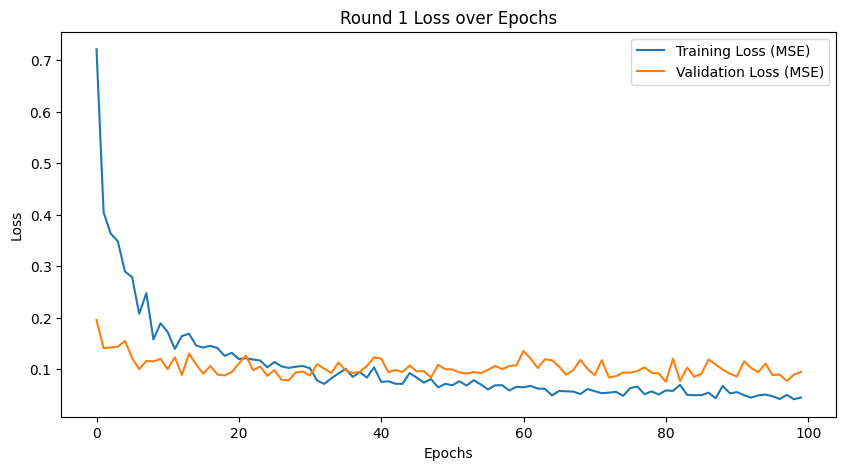

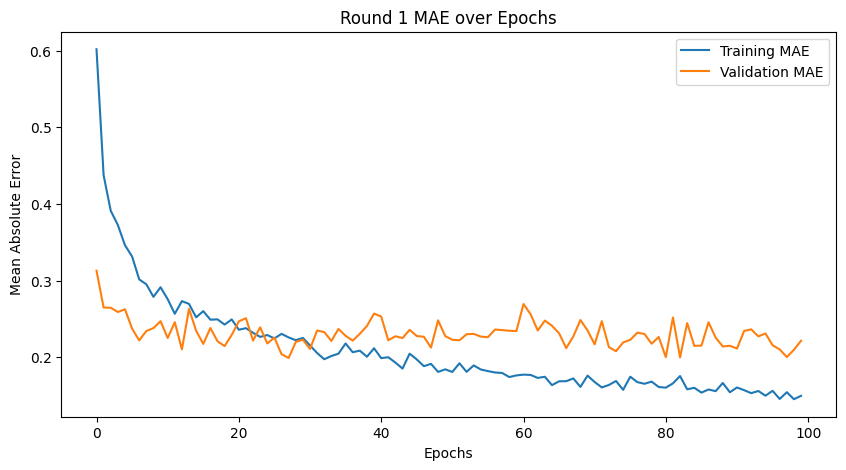

In [ ]:
import matplotlib.pyplot as plt

# Plot loss
plt.figure(figsize=(10,5))
plt.plot(history.history['loss'], label='Training Loss (MSE)')
plt.plot(history.history['val_loss'], label='Validation Loss (MSE)')
plt.legend()
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Round 1 Loss over Epochs')
plt.show()

# Plot MAE
plt.figure(figsize=(10,5))
plt.plot(history.history['mae'], label='Training MAE')
plt.plot(history.history['val_mae'], label='Validation MAE')
plt.legend()
plt.xlabel('Epochs')
plt.ylabel('Mean Absolute Error')
plt.title('Round 1 MAE over Epochs')
plt.show()

### Round 2

Since the training error is going down but the validation is not we might be overfitting going to adjust some parameters like increase dropout rate and early stoppage if there isnt significant change in validation error

In [ ]:
from tensorflow.keras import regularizers
from tensorflow.keras.callbacks import EarlyStopping

early_stop = EarlyStopping(
    monitor='val_loss',    # what to monitor
    patience=10,           # stop after 10 epochs with no improvement
    restore_best_weights=True # rollback to best model
)

#added higher dropout percentage and l2 penalties to choose simpliler model
model2 = keras.Sequential([
    #Layer 1
    layers.Dense(128, activation='relu',kernel_regularizer=regularizers.l2(0.001),
                input_shape=(X_train.shape[1],)),
    layers.Dropout(0.4),

    #Layer 2
    layers.Dense(64, activation='relu',kernel_regularizer=regularizers.l2(0.001)),
    layers.Dropout(0.4),

    #Layer 3
    layers.Dense(32, activation='relu',kernel_regularizer=regularizers.l2(0.001)),
    layers.Dropout(0.4),

    #Layer 4
    layers.Dense(1)
])

# We are using an optimized version of GD to min loss/mse and also giving us mae
model2.compile(optimizer='adam', loss='mse', metrics=['mae'])

# Added early stoppage
history2 = model2.fit(X_train, y_train, validation_split=0.2, epochs=100, batch_size=32,
                    callbacks=[early_stop])



Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.4654 - mae: 0.8155 - val_loss: 0.6447 - val_mae: 0.4540
Epoch 2/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.8829 - mae: 0.5804 - val_loss: 0.5022 - val_mae: 0.3631
Epoch 3/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.8150 - mae: 0.5301 - val_loss: 0.4188 - val_mae: 0.3211
Epoch 4/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.7171 - mae: 0.4692 - val_loss: 0.4667 - val_mae: 0.3513
Epoch 5/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.6752 - mae: 0.4434 - val_loss: 0.3820 - val_mae: 0.2817
Epoch 6/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.5575 - mae: 0.4083 - val_loss: 0.3882 - val_mae: 0.2967
Epoch 7/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.6152 - mae: 0.4113 - val_loss: 0.3734 - val_mae: 0.2938
Epoch 8/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.4974 - mae: 0.3907 - val_loss: 0.3577 - val_mae: 0.2838
Epoch 9/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.6446 - mae: 0.

In [ ]:
# Evaluate
r2_loss, r2_mae = model2.evaluate(X_test, y_test)

print(f"Test Mean Absolute Error: {r2_mae:.2f}")
print(f"Test Mean Sqaure Error: {r2_loss:.2f}")

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.2077 - mae: 0.2338 
Test Mean Absolute Error: 0.24
Test Mean Sqaure Error: 0.21


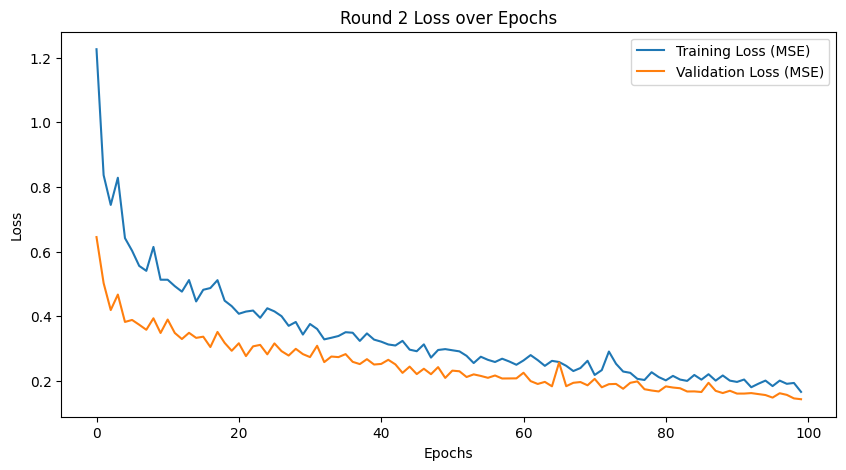

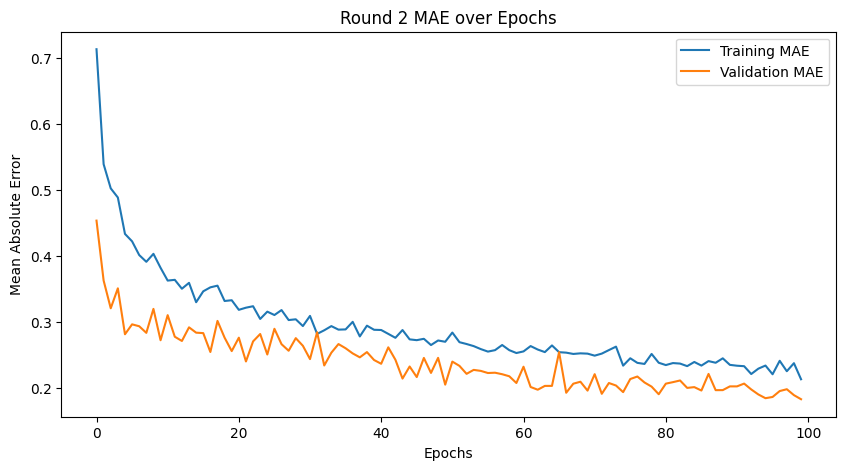

In [ ]:
# Plot loss
plt.figure(figsize=(10,5))
plt.plot(history2.history['loss'], label='Training Loss (MSE)')
plt.plot(history2.history['val_loss'], label='Validation Loss (MSE)')
plt.legend()
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Round 2 Loss over Epochs')
plt.show()

# Plot MAE
plt.figure(figsize=(10,5))
plt.plot(history2.history['mae'], label='Training MAE')
plt.plot(history2.history['val_mae'], label='Validation MAE')
plt.legend()
plt.xlabel('Epochs')
plt.ylabel('Mean Absolute Error')
plt.title('Round 2 MAE over Epochs')
plt.show()

### Round 3
Going to increase penalties, dropout rate and have early stoppage check ever 5 epochs

In [ ]:
#added higher dropout percentage and l2 penalties to choose simpliler model
early_stop2 = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)


model3 = keras.Sequential([
    #Layer 1
    layers.Dense(128, activation='relu',kernel_regularizer=regularizers.l2(0.005),
                 input_shape=(X_train.shape[1],)),
    layers.Dropout(0.5),

    #Layer 2
    layers.Dense(64, activation='relu',kernel_regularizer=regularizers.l2(0.005)),
    layers.Dropout(0.5),

    #Layer 3
    layers.Dense(32, activation='relu',kernel_regularizer=regularizers.l2(0.005)),
    layers.Dropout(0.5),

    #Layer 4
    layers.Dense(1)
])

# We are using an optimized version of GD to min loss/mse and also giving us mae
model3.compile(optimizer='adam', loss='mse', metrics=['mae'])

# Added early stoppage
history3 = model3.fit(X_train, y_train, validation_split=0.2, epochs=100, batch_size=32,
                     callbacks=[early_stop2])


Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 3.4301 - mae: 1.0622 - val_loss: 1.7100 - val_mae: 0.6342
Epoch 2/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 2.2332 - mae: 0.7589 - val_loss: 1.5713 - val_mae: 0.5744
Epoch 3/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.8455 - mae: 0.6233 - val_loss: 1.4912 - val_mae: 0.5316
Epoch 4/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.7009 - mae: 0.5847 - val_loss: 1.3838 - val_mae: 0.4811
Epoch 5/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.6279 - mae: 0.5757 - val_loss: 1.3228 - val_mae: 0.4723
Epoch 6/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.6547 - mae: 0.5775 - val_loss: 1.2271 - val_mae: 0.4186
Epoch 7/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.4570 - mae: 0.4992 - val_loss: 1.1671 - val_mae: 0.3928
Epoch 8/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.4717 - mae: 0.5027 - val_loss: 1.1693 - val_mae: 0.4117
Epoch 9/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 1.3053 - mae: 0

In [ ]:
# Evaluate
r1_loss, r1_mae = model.evaluate(X_test, y_test)
# r1_rmse=np.sqrt(r1_loss)

r2_loss, r2_mae = model2.evaluate(X_test, y_test)
# r2_rmse=np.sqrt(r2_loss)

r3_loss, r3_mae = model3.evaluate(X_test, y_test)
# r3_rmse=np.sqrt(r3_loss)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.2087 - mae: 0.2614 
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.2077 - mae: 0.2338 
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3079 - mae: 0.2167 


In [ ]:
print(f"Round 1 Test Mean Absolute Error: {r1_mae:.2f}")
print(f"Round 1 Test Loss Error: {r1_loss:.2f}")
print(f"Round 2 Test Mean Absolute Error: {r2_mae:.2f}")
print(f"Round 2 Test Loss Error: {r2_loss:.2f}")
print(f"Round 3 Test Mean Absolute Error: {r3_mae:.2f}")
print(f"Round 3 Test Loss Error: {r3_loss:.2f}")


Round 1 Test Mean Absolute Error: 0.28
Round 1 Test Loss Error: 0.23
Round 2 Test Mean Absolute Error: 0.24
Round 2 Test Loss Error: 0.21
Round 3 Test Mean Absolute Error: 0.23
Round 3 Test Loss Error: 0.32


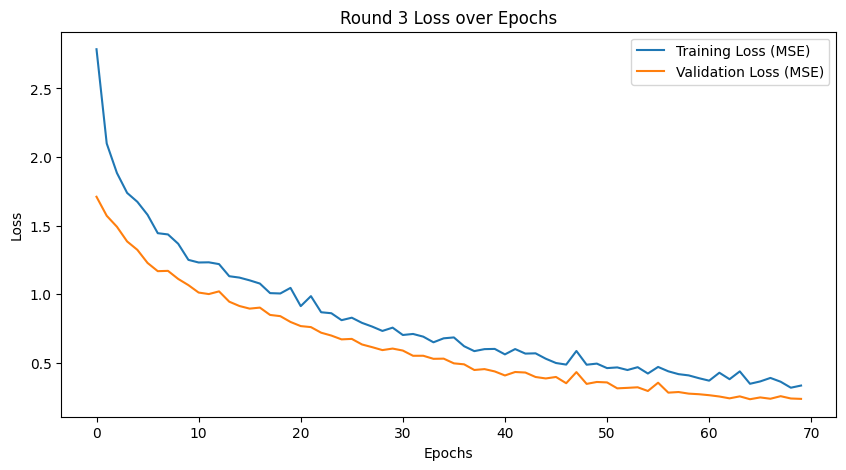

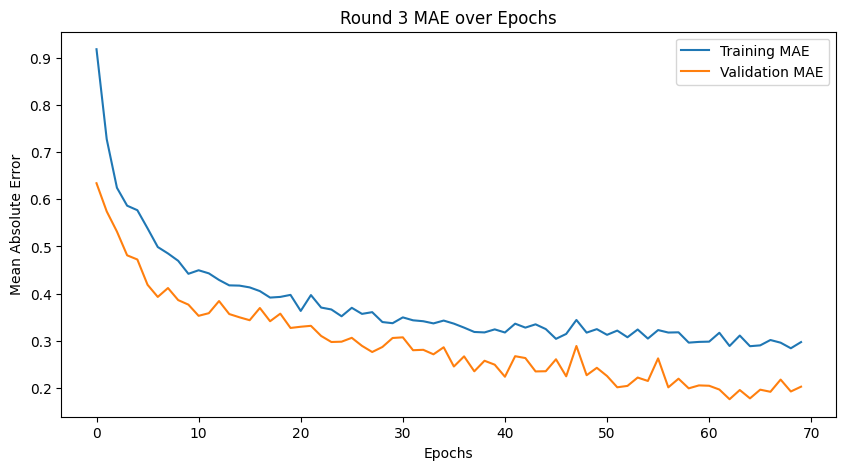

In [ ]:
# Plot loss
plt.figure(figsize=(10,5))
plt.plot(history3.history['loss'], label='Training Loss (MSE)')
plt.plot(history3.history['val_loss'], label='Validation Loss (MSE)')
plt.legend()
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Round 3 Loss over Epochs')
plt.show()

# Plot MAE
plt.figure(figsize=(10,5))
plt.plot(history3.history['mae'], label='Training MAE')
plt.plot(history3.history['val_mae'], label='Validation MAE')
plt.legend()
plt.xlabel('Epochs')
plt.ylabel('Mean Absolute Error')
plt.title('Round 3 MAE over Epochs')
plt.show()

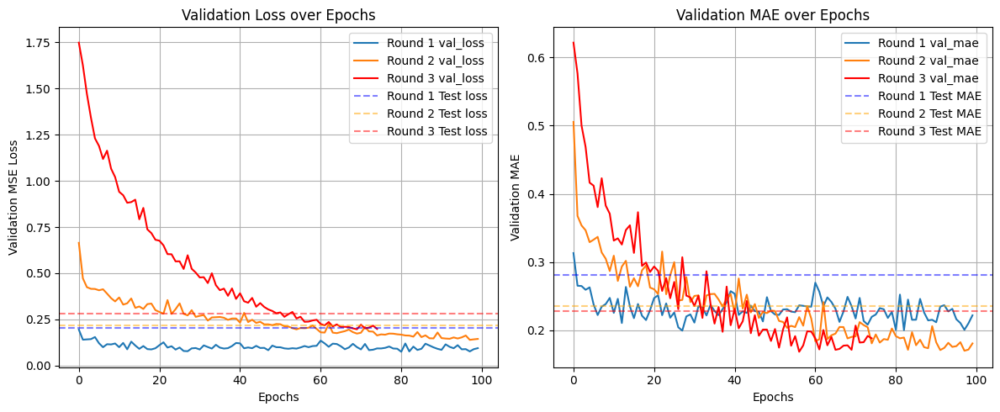

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,5))

# Loss comparison
plt.subplot(1,2,1)
plt.plot(history.history['val_loss'], label='Round 1 val_loss')
plt.plot(history2.history['val_loss'], label='Round 2 val_loss')
plt.plot(history3.history['val_loss'], label='Round 3 val_loss',color='red')
plt.axhline(y=r1_loss, color='blue', linestyle='--',alpha=.5, label='Round 1 Test loss')
plt.axhline(y=r2_loss, color='orange', linestyle='--',alpha=.5, label='Round 2 Test loss')
plt.axhline(y=r3_loss, color='red', linestyle='--',alpha=.5, label='Round 3 Test loss')
plt.xlabel('Epochs')
plt.ylabel('Validation MSE Loss')
plt.title('Validation Loss over Epochs')
plt.legend()
plt.grid(True)

# MAE comparison
plt.subplot(1,2,2)
plt.plot(history.history['val_mae'], label='Round 1 val_mae')
plt.plot(history2.history['val_mae'], label='Round 2 val_mae')
plt.plot(history3.history['val_mae'], label='Round 3 val_mae',color='red')
plt.axhline(y=r1_mae, color='blue', linestyle='--',alpha=.5, label='Round 1 Test MAE')
plt.axhline(y=r2_mae, color='orange', linestyle='--',alpha=.5, label='Round 2 Test MAE')
plt.axhline(y=r3_mae, color='red', linestyle='--',alpha=.5, label='Round 3 Test MAE')

plt.xlabel('Epochs')
plt.ylabel('Validation MAE')
plt.title('Validation MAE over Epochs')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
# Make predictions
y_pred_std = model2.predict(X_test).flatten()
scaler_y = StandardScaler()
scaler_y.fit(df[['SalePrice']])



10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


StandardScaler()

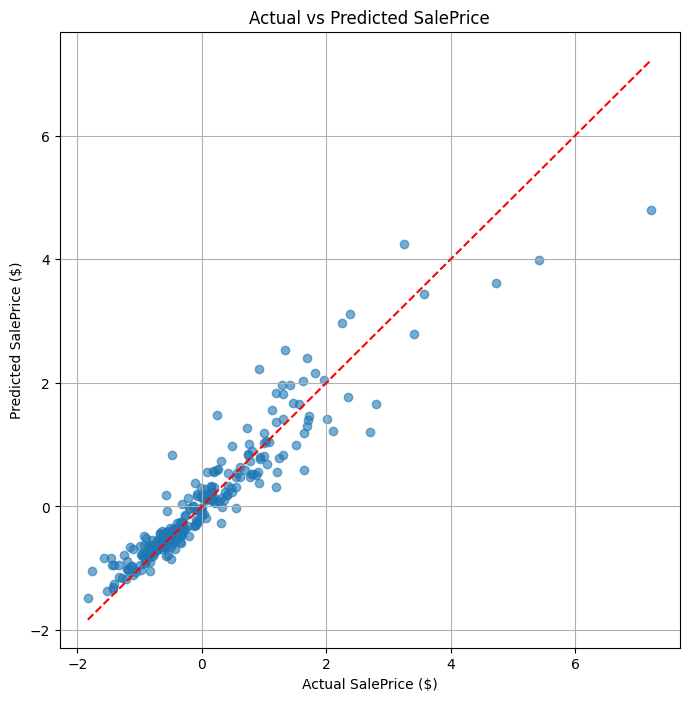

In [ ]:
# Inverse transform back to dollars
y_pred_std = y_pred_std.reshape(-1,1)
y_pred_dollar = scaler_y.inverse_transform(y_pred_std).flatten()
y_test_dollar = scaler_y.inverse_transform(y_test.values.reshape(-1,1)).flatten()

# Plot
import matplotlib.pyplot as plt
plt.figure(figsize=(8,8))
plt.scatter(y_test, y_pred_std, alpha=0.6)
plt.plot([y_test.min(), y_test.max()],
         [y_test.min(), y_test.max()],
         color='red', linestyle='--')
plt.xlabel("Actual SalePrice ($)")
plt.ylabel("Predicted SalePrice ($)")
plt.title("Actual vs Predicted SalePrice")
plt.grid(True)
plt.show()

In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error
import numpy as np

mae_dollar = mean_absolute_error(y_test_dollar, y_pred_dollar)
mse_dollar = mean_squared_error(y_test_dollar, y_pred_dollar)
print(f"MAE: ${mae_dollar:,.0f}")
print(f"RMSE: ${mse_dollar:,.0f}")

MAE: $18,717
RMSE: $884,043,107


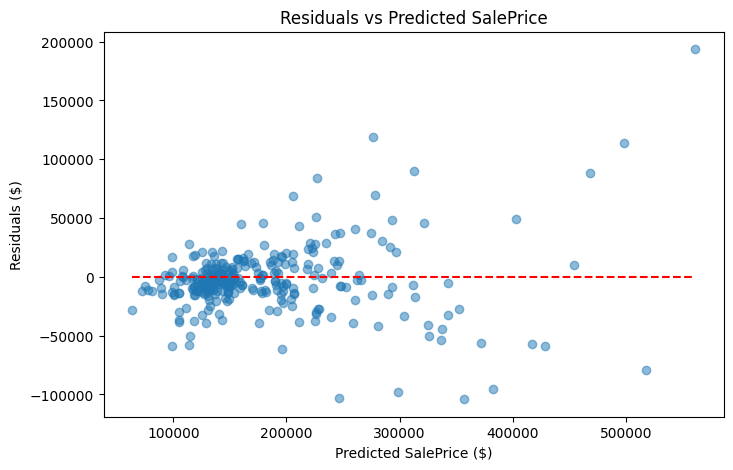

In [ ]:
residuals = y_test_dollar - y_pred_dollar
plt.figure(figsize=(8,5))
plt.scatter(y_pred_dollar, residuals, alpha=0.5)
plt.hlines(0, xmin=y_pred_dollar.min(), xmax=y_pred_dollar.max(), colors='red', linestyles='--')
plt.xlabel('Predicted SalePrice ($)')
plt.ylabel('Residuals ($)')
plt.title('Residuals vs Predicted SalePrice')
plt.show()

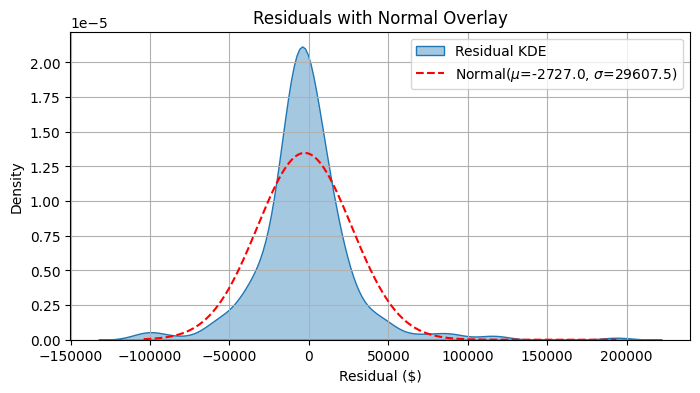

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm

# Assuming your residuals are stored in `residuals`
# residuals = y_actual - y_pred

# Compute mean and std
mu, sigma = residuals.mean(), residuals.std()

# Plot KDE
plt.figure(figsize=(8,4))
sns.kdeplot(residuals, fill=True, alpha=0.4, label="Residual KDE")

# Plot normal distribution with same mean & std
x = np.linspace(residuals.min(), residuals.max(), 1000)
plt.plot(x, norm.pdf(x, mu, sigma), 'r--', label=f"Normal($\mu$={mu:.1f}, $\sigma$={sigma:.1f})")

plt.title("Residuals with Normal Overlay")
plt.xlabel("Residual ($)")
plt.ylabel("Density")
plt.legend()
plt.grid(True)
plt.show()

## SVR model using standardized dataset

In [ ]:
X=df_Sales_orig.drop(columns='SalePrice')
y=df_Sales_orig['SalePrice']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)
scaler_X = StandardScaler()
scaler_y = StandardScaler()
X_train_svm = scaler_X.fit_transform(X_train)
X_test_svm = scaler_X.transform(X_test)

# Important: scale y too
scaler_y.fit(y_train.values.reshape(-1,1))
y_train_svm = scaler_y.transform(y_train.values.reshape(-1,1)).flatten()
y_test_svm = scaler_y.transform(y_test.values.reshape(-1,1)).flatten()

### Round 1

In [286]:
from sklearn.svm import SVR
from sklearn.metrics import mean_absolute_error, mean_squared_error
import numpy as np

In [287]:
#Configurations and scores:
# SVM MAE: 0.24 SVM MSE: 0.20 'rbf', C=1.0, epsilon=0.1 RADIAL BASIS FUNCTION
# SVM MAE: 0.22 SVM MSE: 0.15 'linear', C=1.0, epsilon=0.1
# SVM MAE: 0.23 SVM MSE: 0.14 'poly', C=1.0, epsilon=0.1

svr = SVR(kernel='linear', C=1, epsilon=.1)
# EPSILON is tube radius points inside are considered close enough not to get a penalty
# anything outside of that tube the farther away it is the more penalty it will have.
# Large epsilon less sensitive model.
# C is the penalty incured if its outside the model.

svr.fit(X_train_svm, y_train_svm)

# Make predictions
y_pred_svm_std = svr.predict(X_test_svm)

# Inverse transform to get predictions in original dollars
y_pred_svm_dollar = scaler_y.inverse_transform(y_pred_svm_std.reshape(-1,1)).flatten()
y_test_dollar = scaler_y.inverse_transform(y_test_svm.reshape(-1,1)).flatten()


# Evaluate
mae_svm = mean_absolute_error(y_test_svm, y_pred_svm_std)
mse_svm = mean_squared_error(y_test_svm, y_pred_svm_std)
print(f"Test MAE: {mae_svm:.2f} Test MSE: {mse_svm:.2f}")


Test MAE: 0.22 Test MSE: 0.16


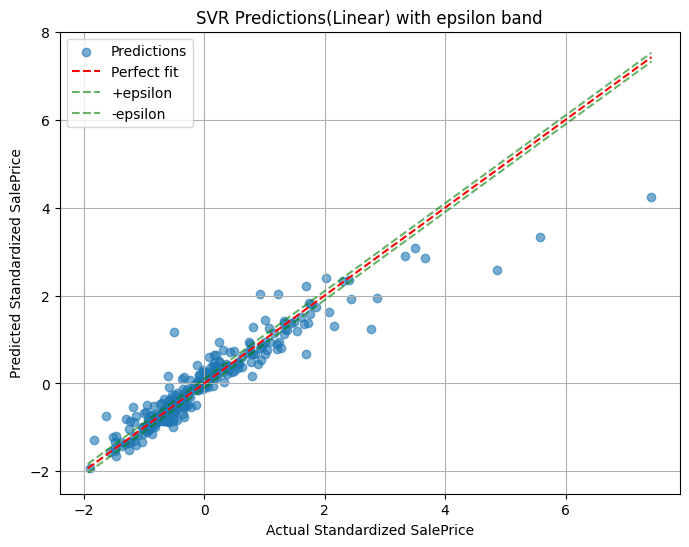

In [288]:
plt.figure(figsize=(8,6))
plt.scatter(y_test_svm, y_pred_svm_std, alpha=0.6, label='Predictions')

# Plot y=x line (perfect prediction)
x_line = np.linspace(min(y_test_svm.min(), y_pred_svm_std.min()), max(y_test_svm.max(), y_pred_svm_std.max()), 100)
plt.plot(x_line, x_line, 'r--', label='Perfect fit')

# Plot epsilon tube
plt.plot(x_line, x_line + 0.1, 'g--', alpha=0.6, label='+epsilon')
plt.plot(x_line, x_line - 0.1, 'g--', alpha=0.6, label='-epsilon')

plt.xlabel("Actual Standardized SalePrice")
plt.ylabel("Predicted Standardized SalePrice")
plt.title("SVR Predictions(Linear) with epsilon band")
plt.legend()
plt.grid(True)
plt.show()

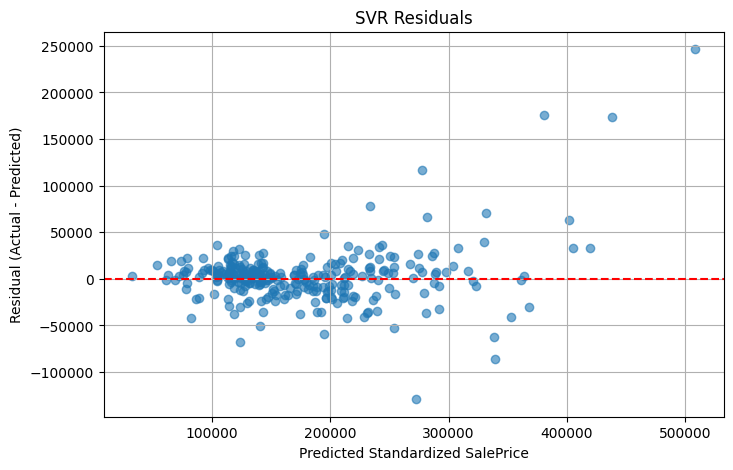

In [289]:
import matplotlib.pyplot as plt
y_pred_dollars = scaler_y.inverse_transform(y_pred_svm_std.reshape(-1,1)).flatten()

residuals_std = y_test_svm - y_pred_svm_std
residuals = residuals_std * scaler_y.scale_[0]
plt.figure(figsize=(8,5))
plt.scatter(y_pred_svm_dollar, residuals, alpha=0.6)
plt.axhline(0, color='red', linestyle='--')
plt.xlabel('Predicted Standardized SalePrice')
plt.ylabel('Residual (Actual - Predicted)')
plt.title('SVR Residuals')
plt.grid(True)
plt.show()

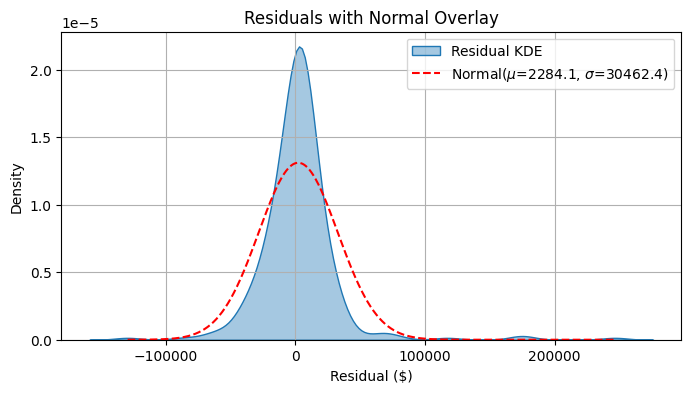

In [290]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm

# Assuming your residuals are stored in `residuals`
# residuals = y_actual - y_pred

# Compute mean and std
mu, sigma = residuals.mean(), residuals.std()

# Plot KDE
plt.figure(figsize=(8,4))
sns.kdeplot(residuals, fill=True, alpha=0.4, label="Residual KDE")

# Plot normal distribution with same mean & std
x = np.linspace(residuals.min(), residuals.max(), 1000)
plt.plot(x, norm.pdf(x, mu, sigma), 'r--', label=f"Normal($\mu$={mu:.1f}, $\sigma$={sigma:.1f})")

plt.title("Residuals with Normal Overlay")
plt.xlabel("Residual ($)")
plt.ylabel("Density")
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
import os
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm

from sklearn.preprocessing import StandardScaler, PolynomialFeatures, SplineTransformer
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import train_test_split, KFold, cross_val_score, GridSearchCV
from sklearn.linear_model import LinearRegression, Ridge, LassoCV
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.ensemble import RandomForestRegressor
from sklearn.impute import KNNImputer
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.inspection import permutation_importance, PartialDependenceDisplay

from scipy.stats import boxcox

## Regressions

In [ ]:
X=df_Sales_stand.drop(columns='SalePrice')
y=df_Sales_stand['SalePrice']

X_train_val, X_test, y_train_val, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)
print(X_train_val.shape)
print(X_test.shape)
print(y_train_val.shape)
print(y_test.shape)


(1168, 77)
(292, 77)
(1168,)
(292,)


### Linear Regression Model

$$
y = \beta_0 + \beta_1 x_1 + \beta_2 x_2 + \beta_3 x_3 + \cdots
$$


In [ ]:
# train model
lr = LinearRegression()
lr.fit(X_train_val, y_train_val)

# ========== Training Set Evaluation ==========
y_train_pred_lr = lr.predict(X_train_val)

mse_train_lr = mean_squared_error(y_train_val, y_train_pred_lr)
mae_train_lr = mean_absolute_error(y_train_val, y_train_pred_lr)
r2_train_lr = r2_score(y_train_val, y_train_pred_lr)
adj_r2_train_lr = 1 - (1 - r2_train_lr) * (len(y_train_val) - 1) / (len(y_train_val) - X_train_val.shape[1] - 1)

print("===== Training Set Performance (Linear Regression) =====")
print(f"Mean Squared Error (MSE): {mse_train_lr:.4f}")
print(f"Mean Absolute Error (MAE): {mae_train_lr:.4f}")
print(f"R² Score: {r2_train_lr:.4f}")
print(f"Adjusted R² Score: {adj_r2_train_lr:.4f}")

# ========== Test Set Evaluation ==========
y_test_pred_lr = lr.predict(X_test)

mse_test_lr = mean_squared_error(y_test, y_test_pred_lr)
mae_test_lr = mean_absolute_error(y_test, y_test_pred_lr)
r2_test_lr = r2_score(y_test, y_test_pred_lr)
adj_r2_test_lr = 1 - (1 - r2_test_lr) * (len(y_test) - 1) / (len(y_test) - X_test.shape[1] - 1)

print("\n===== Test Set Performance (Linear Regression) =====")
print(f"Mean Squared Error (MSE): {mse_test_lr:.4f}")
print(f"Mean Absolute Error (MAE): {mae_test_lr:.4f}")
print(f"R² Score: {r2_test_lr:.4f}")
print(f"Adjusted R² Score: {adj_r2_test_lr:.4f}")

===== Training Set Performance (Linear Regression) =====
Mean Squared Error (MSE): 0.1244
Mean Absolute Error (MAE): 0.2157
R² Score: 0.8685
Adjusted R² Score: 0.8592

===== Test Set Performance (Linear Regression) =====
Mean Squared Error (MSE): 0.1611
Mean Absolute Error (MAE): 0.2373
R² Score: 0.8676
Adjusted R² Score: 0.8199


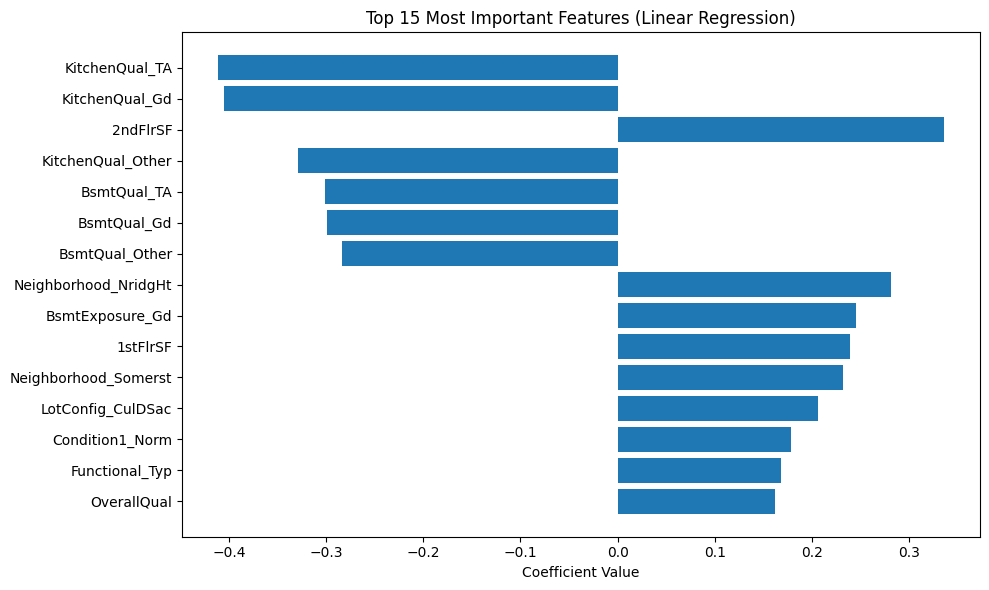

In [ ]:
# top 15 most important feature based on absolute value
feature_names = X_train_val.columns if hasattr(X_train_val, "columns") else [f"X{i}" for i in range(X_train_val.shape[1])]
coefs = lr.coef_

# pick top 15 values based on their absolute values
top15_idx = np.argsort(np.abs(coefs))[::-1][:15]
top15_features = [feature_names[i] for i in top15_idx]
top15_coefs = coefs[top15_idx]

# DataFrame
top15_df = pd.DataFrame({
    "Feature": top15_features,
    "Coefficient": top15_coefs
})

# ==== plot ====
plt.figure(figsize=(10, 6))
plt.barh(top15_df["Feature"][::-1], top15_df["Coefficient"][::-1])
plt.xlabel("Coefficient Value")
plt.title("Top 15 Most Important Features (Linear Regression)")
plt.tight_layout()
plt.show()

Explore permutation importance

$$
\text{PI}(X_j) = \frac{1}{R} \sum_{r=1}^{R} \left[ M(f(X), y) - M(f(X^{\text{perm}(j,r)}), y) \right]
$$

$X^{\text{perm}(j,r)}$ is the feature matrix where the $j$-th column is randomly permuted in the $r$-th repetition.  
$f(\cdot)$ is the trained model.  
$M(\cdot, y)$ is the evaluation metric (e.g., `neg_mean_squared_error`, `accuracy`, etc.).  
$R$ is the number of repetitions (`n_repeats`).  
$\text{PI}(X_j)$ is the permutation importance of feature $X_j$.

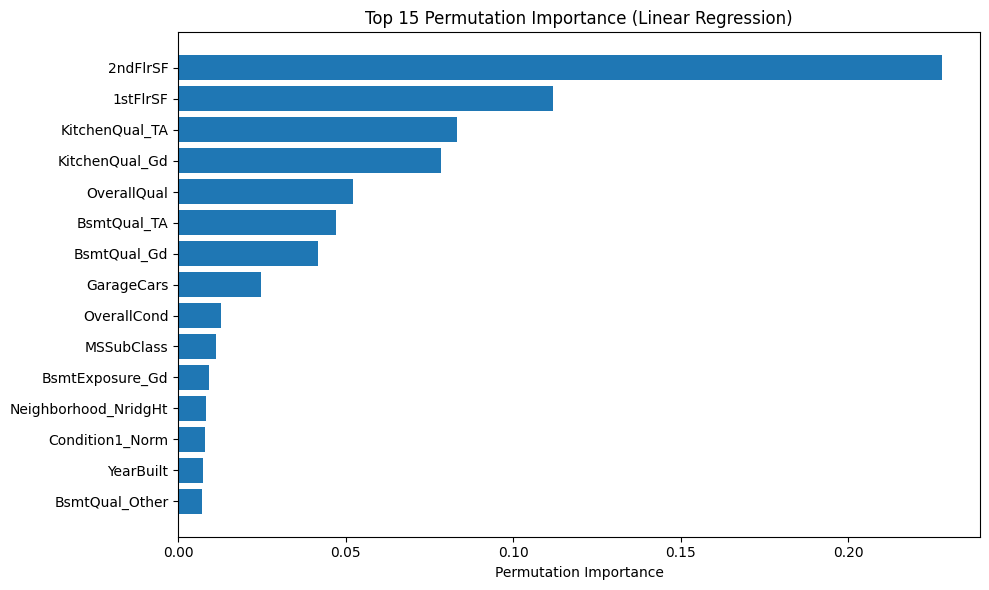

In [ ]:
feature_names = X_train_val.columns if hasattr(X_train_val, "columns") else [f"X{i}" for i in range(X_train_val.shape[1])]

# ===== compute Permutation Importance =====
perm_result = permutation_importance(
    lr,
    X_train_val,
    y_train_val,
    scoring='neg_mean_squared_error',
    n_repeats=10,
    random_state=42,
    n_jobs=-1
)

# pick top 15 values
perm_importances = perm_result.importances_mean
top15_idx = np.argsort(perm_importances)[::-1][:15]

# DataFrame
perm_top15_df = pd.DataFrame({
    "Feature": [feature_names[i] for i in top15_idx],
    "Permutation Importance": perm_importances[top15_idx]
})

# ===== plot =====
plt.figure(figsize=(10, 6))
plt.barh(perm_top15_df["Feature"][::-1], perm_top15_df["Permutation Importance"][::-1])
plt.xlabel("Permutation Importance")
plt.title("Top 15 Permutation Importance (Linear Regression)")
plt.tight_layout()
plt.show()

Partial Dependence Plot   
How one variable influence the prediction?

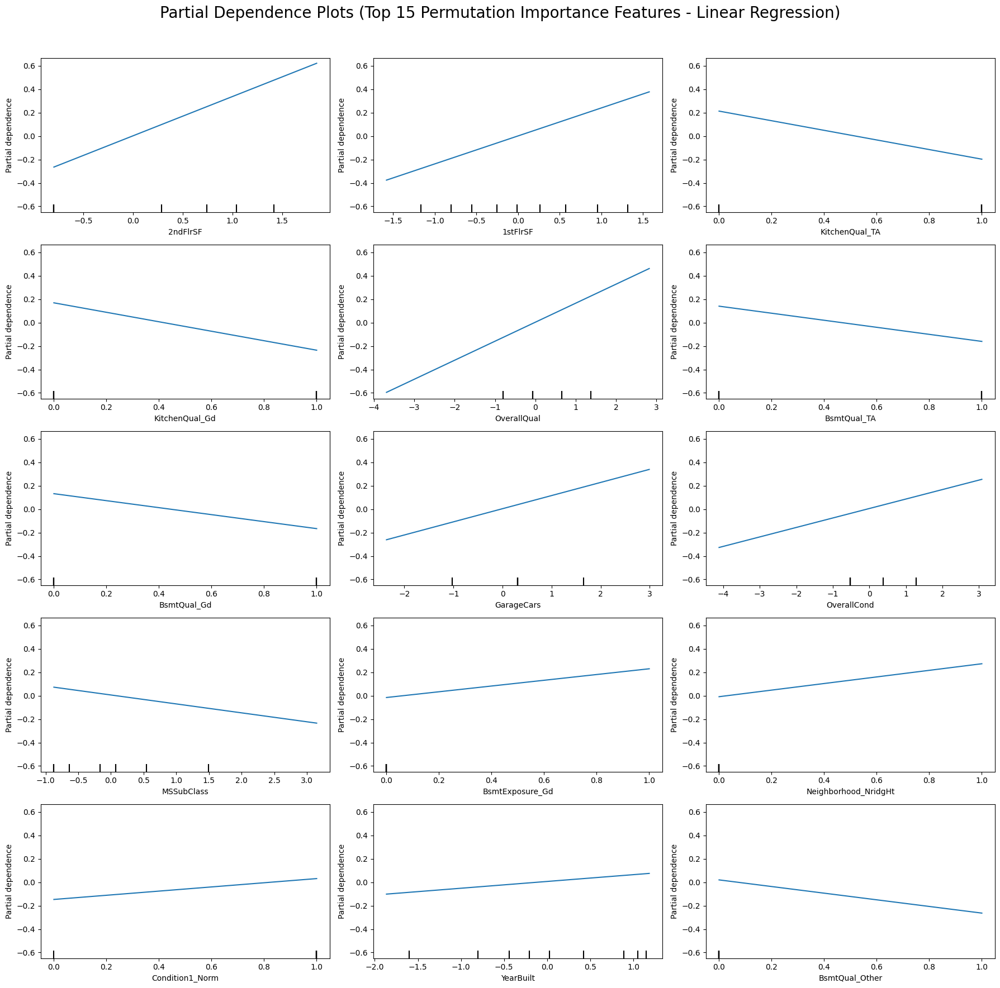

In [ ]:
# feature names
feature_names = X_train_val.columns if hasattr(X_train_val, "columns") else [f"X{i}" for i in range(X_train_val.shape[1])]

# === compute permutation importance ===
perm_result = permutation_importance(
    lr,
    X_train_val,
    y_train_val,
    scoring='neg_mean_squared_error',
    n_repeats=10,
    random_state=42,
    n_jobs=-1
)

perm_importances = perm_result.importances_mean
top15_idx = np.argsort(perm_importances)[::-1][:15]
top15_features = [feature_names[i] for i in top15_idx]

# === plot PDP  ===
fig, axs = plt.subplots(nrows=5, ncols=3, figsize=(18, 18))
axs = axs.flatten()

PartialDependenceDisplay.from_estimator(
    lr,
    X_train_val,
    features=top15_features,
    feature_names=feature_names,
    grid_resolution=50,
    ax=axs
)

plt.suptitle("Partial Dependence Plots (Top 15 Permutation Importance Features - Linear Regression)", fontsize=20)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

### LASSO Regression

$$
\mathcal{L}(\boldsymbol{\beta}) = \frac{1}{2n} \sum_{i=1}^{n} \left( y^{(i)} - \beta_0 - \sum_{j=1}^{p} \beta_j x_j^{(i)} \right)^2 + \lambda \sum_{j=1}^{p} |\beta_j|
$$

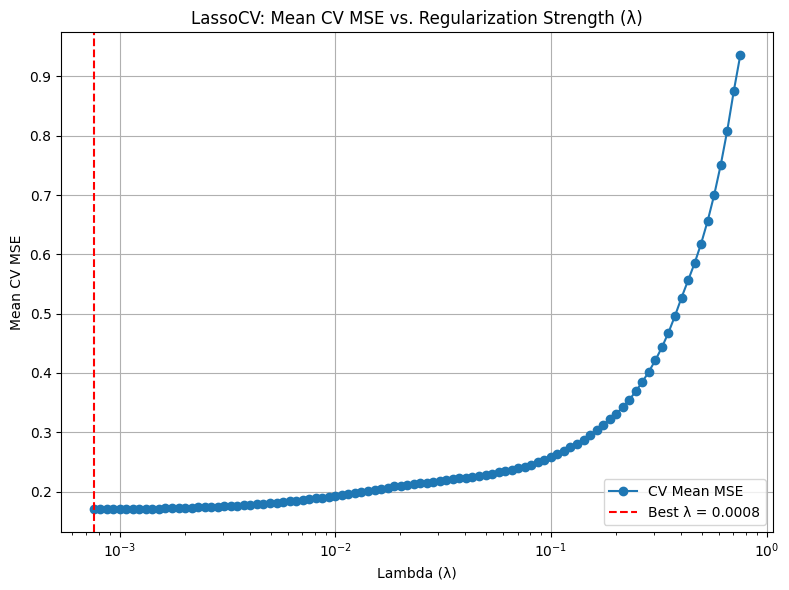

In [ ]:
asso = LassoCV(cv=5, random_state=42)
lasso.fit(X_train_val, y_train_val)

alphas = lasso.alphas_
mean_mse = np.mean(lasso.mse_path_, axis=1)
best_alpha = lasso.alpha_

# Lambda vs CV MSE
plt.figure(figsize=(8, 6))
plt.plot(alphas, mean_mse, marker='o', label='CV Mean MSE')
plt.axvline(best_alpha, color='red', linestyle='--', label=f'Best λ = {best_alpha:.4f}')
plt.xscale('log')
plt.xlabel('Lambda (λ)')
plt.ylabel('Mean CV MSE')
plt.title('LassoCV: Mean CV MSE vs. Regularization Strength (λ)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
# Use the fitted Lasso model (with best lambda selected)

# ===== Training Set Evaluation =====
y_train_pred_lasso = lasso.predict(X_train_val)
mse_train_lasso = mean_squared_error(y_train_val, y_train_pred_lasso)
mae_train_lasso = mean_absolute_error(y_train_val, y_train_pred_lasso)
r2_train_lasso = r2_score(y_train_val, y_train_pred_lasso)
adj_r2_train_lasso = 1 - (1 - r2_train_lasso) * (len(y_train_val) - 1) / (len(y_train_val) - X_train_val.shape[1] - 1)

# ===== Test Set Evaluation =====
y_test_pred_lasso = lasso.predict(X_test)
mse_test_lasso = mean_squared_error(y_test, y_test_pred_lasso)
mae_test_lasso = mean_absolute_error(y_test, y_test_pred_lasso)
r2_test_lasso = r2_score(y_test, y_test_pred_lasso)
adj_r2_test_lasso = 1 - (1 - r2_test_lasso) * (len(y_test) - 1) / (len(y_test) - X_test.shape[1] - 1)

# ===== Print Results =====
print("===== Lasso Regression Performance Summary =====")
print(f"Best Lambda (λ): {lasso.alpha_:.6f}")

print("\n--- Training Set ---")
print(f"Mean Squared Error (MSE): {mse_train_lasso:.4f}")
print(f"Mean Absolute Error (MAE): {mae_train_lasso:.4f}")
print(f"R² Score: {r2_train_lasso:.4f}")
print(f"Adjusted R² Score: {adj_r2_train_lasso:.4f}")

print("\n--- Test Set ---")
print(f"Mean Squared Error (MSE): {mse_test_lasso:.4f}")
print(f"Mean Absolute Error (MAE): {mae_test_lasso:.4f}")
print(f"R² Score: {r2_test_lasso:.4f}")
print(f"Adjusted R² Score: {adj_r2_test_lasso:.4f}")

===== Lasso Regression Performance Summary =====
Best Lambda (λ): 0.000755

--- Training Set ---
Mean Squared Error (MSE): 0.1249
Mean Absolute Error (MAE): 0.2143
R² Score: 0.8679
Adjusted R² Score: 0.8586

--- Test Set ---
Mean Squared Error (MSE): 0.1625
Mean Absolute Error (MAE): 0.2360
R² Score: 0.8664
Adjusted R² Score: 0.8184


### Ridge Regression

$$
\mathcal{L}(\boldsymbol{\beta}) = \frac{1}{2n} \sum_{i=1}^{n} \left( y^{(i)} - \beta_0 - \sum_{j=1}^{p} \beta_j x_j^{(i)} \right)^2 + \lambda \sum_{j=1}^{p} \beta_j^2
$$

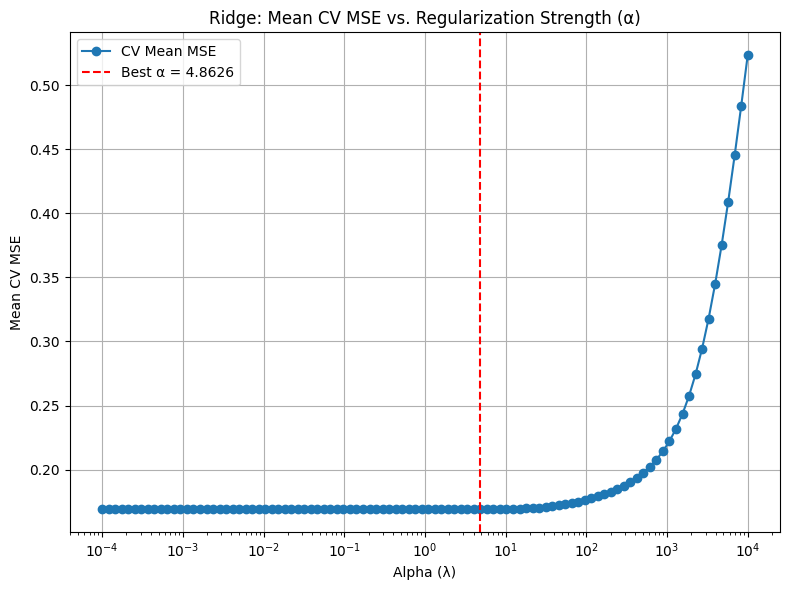

In [ ]:
# Candidate range for alpha
alphas = np.logspace(-4, 4, 100)
param_grid = {'alpha': alphas}

# Ridge Regression with GridSearchCV
ridge = Ridge()
grid = GridSearchCV(ridge, param_grid, cv=5, scoring='neg_mean_squared_error')
grid.fit(X_train_val, y_train_val)

# Extract results
mean_mse = -grid.cv_results_['mean_test_score']
best_alpha = grid.best_params_['alpha']

# Visualization
plt.figure(figsize=(8, 6))
plt.plot(alphas, mean_mse, marker='o', label='CV Mean MSE')
plt.axvline(best_alpha, color='red', linestyle='--', label=f'Best α = {best_alpha:.4f}')
plt.xscale('log')
plt.xlabel('Alpha (λ)')
plt.ylabel('Mean CV MSE')
plt.title('Ridge: Mean CV MSE vs. Regularization Strength (α)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
# Fit final Ridge model using the best alpha
ridge_best = Ridge(alpha=best_alpha)
ridge_best.fit(X_train_val, y_train_val)

# Training set prediction and evaluation
y_train_pred_ridge = ridge_best.predict(X_train_val)
mse_train_ridge = mean_squared_error(y_train_val, y_train_pred_ridge)
mae_train_ridge = mean_absolute_error(y_train_val, y_train_pred_ridge)
r2_train_ridge = r2_score(y_train_val, y_train_pred_ridge)
adj_r2_train_ridge = 1 - (1 - r2_train_ridge) * (len(y_train_val) - 1) / (len(y_train_val) - X_train_val.shape[1] - 1)

# Test set prediction and evaluation
y_test_pred_ridge = ridge_best.predict(X_test)
mse_test_ridge = mean_squared_error(y_test, y_test_pred_ridge)
mae_test_ridge = mean_absolute_error(y_test, y_test_pred_ridge)
r2_test_ridge = r2_score(y_test, y_test_pred_ridge)
adj_r2_test_ridge = 1 - (1 - r2_test_ridge) * (len(y_test) - 1) / (len(y_test) - X_test.shape[1] - 1)

# Print results
print("===== Ridge Regression Performance Summary =====")
print(f"Best Alpha (λ): {best_alpha:.6f}")

print("\n--- Training Set ---")
print(f"Mean Squared Error (MSE): {mse_train_ridge:.4f}")
print(f"Mean Absolute Error (MAE): {mae_train_ridge:.4f}")
print(f"R² Score: {r2_train_ridge:.4f}")
print(f"Adjusted R² Score: {adj_r2_train_ridge:.4f}")

print("\n--- Test Set ---")
print(f"Mean Squared Error (MSE): {mse_test_ridge:.4f}")
print(f"Mean Absolute Error (MAE): {mae_test_ridge:.4f}")
print(f"R² Score: {r2_test_ridge:.4f}")
print(f"Adjusted R² Score: {adj_r2_test_ridge:.4f}")

===== Ridge Regression Performance Summary =====
Best Alpha (λ): 4.862602

--- Training Set ---
Mean Squared Error (MSE): 0.1250
Mean Absolute Error (MAE): 0.2147
R² Score: 0.8678
Adjusted R² Score: 0.8585

--- Test Set ---
Mean Squared Error (MSE): 0.1607
Mean Absolute Error (MAE): 0.2350
R² Score: 0.8679
Adjusted R² Score: 0.8204


### Ploynomial Regression(degree 2) & Ploy with Ridge

Ploynomial with degree = 2
$$
\mathcal{L}(\boldsymbol{\beta}) = \frac{1}{2n} \sum_{i=1}^{n} \left( y^{(i)} - \beta_0
- \sum_{j=1}^{p} \beta_j x_j^{(i)}
- \sum_{j=1}^{p} \sum_{k=j}^{p} \beta_{jk} \, x_j^{(i)} x_k^{(i)} \right)^2
$$

In [ ]:
# Set polynomial degree to 2
poly2 = PolynomialFeatures(degree=2, include_bias=False)
X_train_poly2 = poly2.fit_transform(X_train_val)
X_test_poly2 = poly2.transform(X_test)

# Train a degree-2 polynomial regression model
model_poly2 = LinearRegression()
model_poly2.fit(X_train_poly2, y_train_val)

# Training set prediction and evaluation
y_train_pred_poly2 = model_poly2.predict(X_train_poly2)
mse_train_poly2 = mean_squared_error(y_train_val, y_train_pred_poly2)
mae_train_poly2 = mean_absolute_error(y_train_val, y_train_pred_poly2)
r2_train_poly2 = r2_score(y_train_val, y_train_pred_poly2)
adj_r2_train_poly2 = 1 - (1 - r2_train_poly2) * (len(y_train_val) - 1) / (len(y_train_val) - X_train_poly2.shape[1] - 1)

# Test set prediction and evaluation
y_test_pred_poly2 = model_poly2.predict(X_test_poly2)
mse_test_poly2 = mean_squared_error(y_test, y_test_pred_poly2)
mae_test_poly2 = mean_absolute_error(y_test, y_test_pred_poly2)
r2_test_poly2 = r2_score(y_test, y_test_pred_poly2)
adj_r2_test_poly2 = 1 - (1 - r2_test_poly2) * (len(y_test) - 1) / (len(y_test) - X_test_poly2.shape[1] - 1)

# Print results
print("===== Polynomial Regression (Degree = 2) Performance Summary =====")

print("\n--- Training Set ---")
print(f"Mean Squared Error (MSE): {mse_train_poly2:.4f}")
print(f"Mean Absolute Error (MAE): {mae_train_poly2:.4f}")
print(f"R² Score: {r2_train_poly2:.4f}")
print(f"Adjusted R² Score: {adj_r2_train_poly2:.4f}")

print("\n--- Test Set ---")
print(f"Mean Squared Error (MSE): {mse_test_poly2:.4f}")
print(f"Mean Absolute Error (MAE): {mae_test_poly2:.4f}")
print(f"R² Score: {r2_test_poly2:.4f}")
print(f"Adjusted R² Score: {adj_r2_test_poly2:.4f}")

===== Polynomial Regression (Degree = 2) Performance Summary =====

--- Training Set ---
Mean Squared Error (MSE): 0.0000
Mean Absolute Error (MAE): 0.0000
R² Score: 1.0000
Adjusted R² Score: 1.0000

--- Test Set ---
Mean Squared Error (MSE): 0.2542
Mean Absolute Error (MAE): 0.3506
R² Score: 0.7910
Adjusted R² Score: 1.0218


Ploynomial (degree = 2) with Ridge
$$
\mathcal{L}(\boldsymbol{\beta}) =
\frac{1}{2n} \sum_{i=1}^{n} \left(
y^{(i)} - \beta_0
- \sum_{j=1}^{p} \beta_j x_j^{(i)}
- \sum_{j=1}^{p} \sum_{k=j}^{p} \beta_{jk} \, x_j^{(i)} x_k^{(i)}
\right)^2
+ \lambda \left(
\sum_{j=1}^{p} \beta_j^2
+ \sum_{j=1}^{p} \sum_{k=j}^{p} \beta_{jk}^2
\right)
$$

===== Polynomial Regression (Degree = 2) + Ridge (via GridSearchCV) =====
Best Lambda (λ): 372.759372

--- Training Set ---
Mean Squared Error (MSE): 0.0314
Mean Absolute Error (MAE): 0.1215
R² Score: 0.9668
Adjusted R² Score: 1.0203

--- Test Set ---
Mean Squared Error (MSE): 0.1280
Mean Absolute Error (MAE): 0.2265
R² Score: 0.8948
Adjusted R² Score: 1.0110


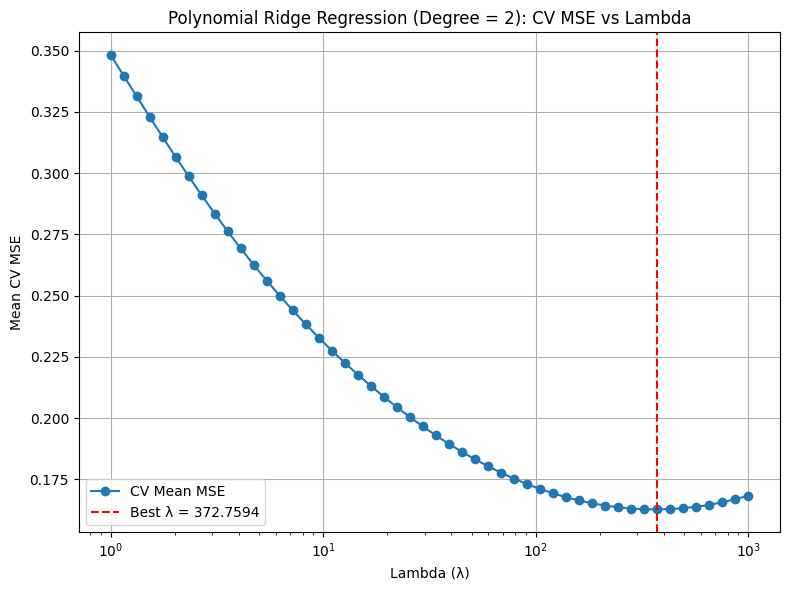

In [ ]:
# ====== Polynomial Features (degree = 2) ======
poly2 = PolynomialFeatures(degree=2, include_bias=False)
X_train_poly2andRidge = poly2.fit_transform(X_train_val)
X_test_poly2andRidge = poly2.transform(X_test)

# ====== GridSearchCV to find the best Ridge lambda ======
lambdas_poly2andRidge = np.logspace(0, 3, 50)  # Equivalent to original alpha
param_grid_poly2andRidge = {'alpha': lambdas_poly2andRidge}
ridge_poly2andRidge = Ridge()

ridge_grid_poly2andRidge = GridSearchCV(
    ridge_poly2andRidge,
    param_grid_poly2andRidge,
    cv=5,
    scoring='neg_mean_squared_error',
    return_train_score=True
)
ridge_grid_poly2andRidge.fit(X_train_poly2andRidge, y_train_val)

best_lambda_poly2andRidge = ridge_grid_poly2andRidge.best_params_['alpha']
best_model_poly2andRidge = ridge_grid_poly2andRidge.best_estimator_

# ====== Model Evaluation ======
# Training set
y_train_pred_poly2andRidge = best_model_poly2andRidge.predict(X_train_poly2andRidge)
mse_train_poly2andRidge = mean_squared_error(y_train_val, y_train_pred_poly2andRidge)
mae_train_poly2andRidge = mean_absolute_error(y_train_val, y_train_pred_poly2andRidge)
r2_train_poly2andRidge = r2_score(y_train_val, y_train_pred_poly2andRidge)
adj_r2_train_poly2andRidge = 1 - (1 - r2_train_poly2andRidge) * (len(y_train_val) - 1) / (len(y_train_val) - X_train_poly2andRidge.shape[1] - 1)

# Test set
y_test_pred_poly2andRidge = best_model_poly2andRidge.predict(X_test_poly2andRidge)
mse_test_poly2andRidge = mean_squared_error(y_test, y_test_pred_poly2andRidge)
mae_test_poly2andRidge = mean_absolute_error(y_test, y_test_pred_poly2andRidge)
r2_test_poly2andRidge = r2_score(y_test, y_test_pred_poly2andRidge)
adj_r2_test_poly2andRidge = 1 - (1 - r2_test_poly2andRidge) * (len(y_test) - 1) / (len(y_test) - X_test_poly2andRidge.shape[1] - 1)

# ====== Print Evaluation Results ======
print("===== Polynomial Regression (Degree = 2) + Ridge (via GridSearchCV) =====")
print(f"Best Lambda (λ): {best_lambda_poly2andRidge:.6f}")

print("\n--- Training Set ---")
print(f"Mean Squared Error (MSE): {mse_train_poly2andRidge:.4f}")
print(f"Mean Absolute Error (MAE): {mae_train_poly2andRidge:.4f}")
print(f"R² Score: {r2_train_poly2andRidge:.4f}")
print(f"Adjusted R² Score: {adj_r2_train_poly2andRidge:.4f}")

print("\n--- Test Set ---")
print(f"Mean Squared Error (MSE): {mse_test_poly2andRidge:.4f}")
print(f"Mean Absolute Error (MAE): {mae_test_poly2andRidge:.4f}")
print(f"R² Score: {r2_test_poly2andRidge:.4f}")
print(f"Adjusted R² Score: {adj_r2_test_poly2andRidge:.4f}")

# ====== Plot: Lambda vs CV MSE ======
cv_results_poly2andRidge = ridge_grid_poly2andRidge.cv_results_
mean_cv_mse_poly2andRidge = -cv_results_poly2andRidge['mean_test_score']

plt.figure(figsize=(8, 6))
plt.plot(lambdas_poly2andRidge, mean_cv_mse_poly2andRidge, marker='o', label='CV Mean MSE')
plt.axvline(best_lambda_poly2andRidge, color='red', linestyle='--', label=f'Best λ = {best_lambda_poly2andRidge:.4f}')
plt.xscale('log')
plt.xlabel('Lambda (λ)')
plt.ylabel('Mean CV MSE')
plt.title('Polynomial Ridge Regression (Degree = 2): CV MSE vs Lambda')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

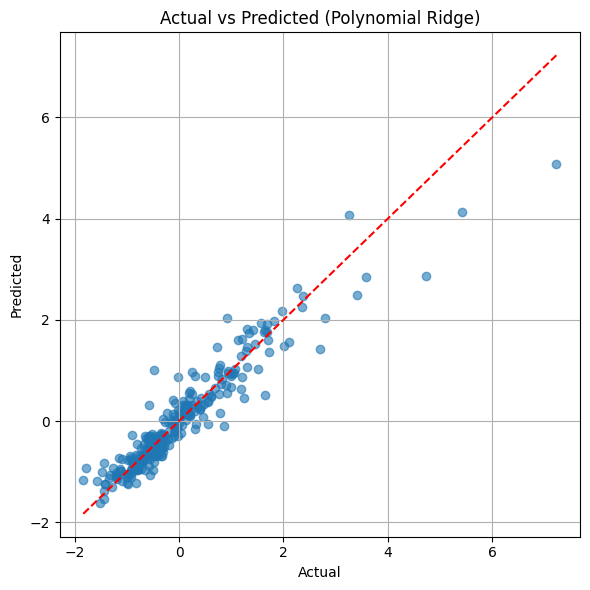

In [ ]:
plt.figure(figsize=(6, 6))
plt.scatter(y_test, y_test_pred_poly2andRidge, alpha=0.6)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel("Actual")
plt.ylabel("Predicted")
plt.title("Actual vs Predicted (Polynomial Ridge)")
plt.grid(True)
plt.tight_layout()
plt.show()

Top 15 Most Important Features (by Ridge Coefficients):
                            Feature  Coefficient
869                      2ndFlrSF^2     0.039133
611          BsmtFinSF1 OpenPorchSF    -0.031884
230                   OverallQual^2     0.025747
748         TotalBsmtSF OpenPorchSF    -0.024940
2                       OverallQual     0.024772
10                         1stFlrSF     0.024365
898        2ndFlrSF Condition1_Norm     0.023964
763  TotalBsmtSF Neighborhood_Other     0.022698
162             LotArea TotalBsmtSF    -0.022399
765     TotalBsmtSF Condition1_Norm     0.021905
858         1stFlrSF Functional_Typ     0.021893
268     OverallQual Condition1_Norm     0.021711
541          MasVnrArea OpenPorchSF    -0.021288
294      OverallQual Functional_Typ     0.020145
176             LotArea OpenPorchSF    -0.019910


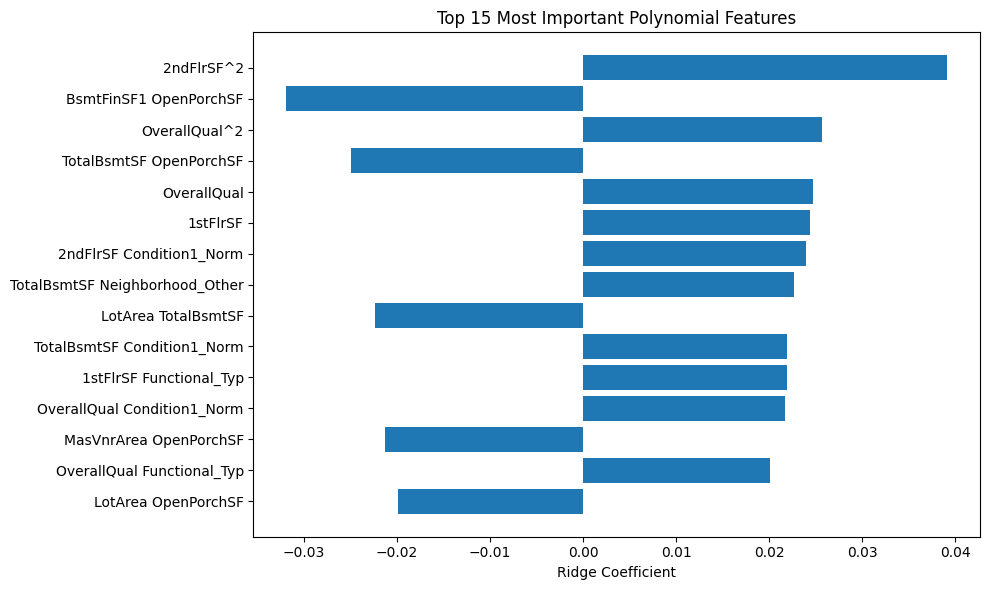

In [ ]:
# Get polynomial feature names
feature_names_poly = poly2.get_feature_names_out(input_features=X_train_val.columns)

# Get ridge regression coefficients
coefs = best_model_poly2andRidge.coef_

# Create a DataFrame to store feature names and corresponding coefficients
coef_df = pd.DataFrame({
    'Feature': feature_names_poly,
    'Coefficient': coefs,
    'Abs_Coefficient': np.abs(coefs)
})

# Select the top 15 most important features (by absolute coefficient values)
top15_coef_df = coef_df.sort_values(by='Abs_Coefficient', ascending=False).head(15)

# Print the top 15 feature table
print("Top 15 Most Important Features (by Ridge Coefficients):")
print(top15_coef_df[['Feature', 'Coefficient']])

# Visualization
plt.figure(figsize=(10, 6))
plt.barh(top15_coef_df['Feature'][::-1], top15_coef_df['Coefficient'][::-1])
plt.xlabel("Ridge Coefficient")
plt.title("Top 15 Most Important Polynomial Features")
plt.tight_layout()
plt.show()

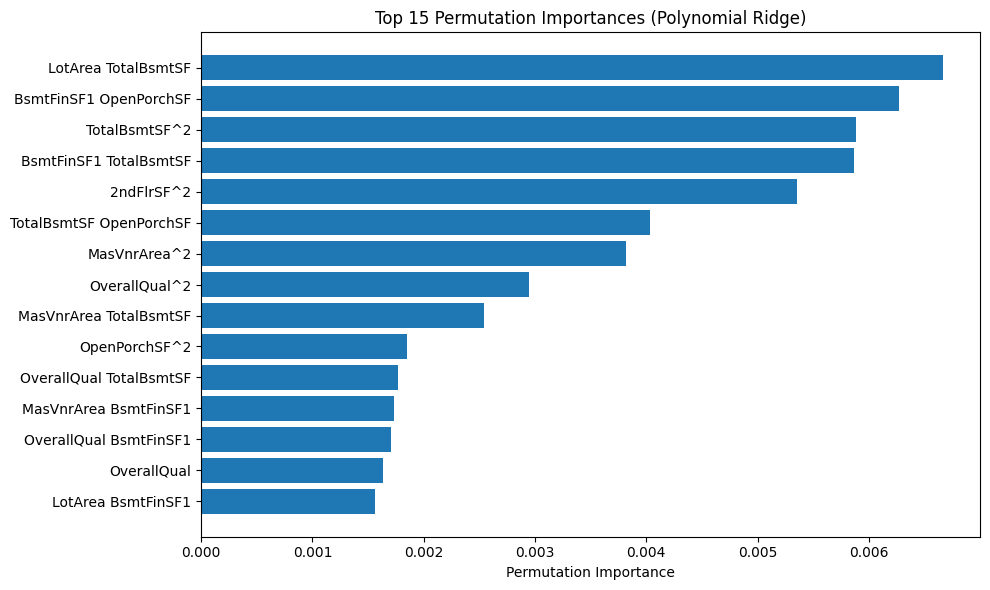

In [ ]:
# Get polynomial feature names (you are using PolynomialFeatures(degree=2))
feature_names_poly = poly2.get_feature_names_out(input_features=X_train_val.columns)

# === Compute permutation importance ===
perm_result_poly2_ridge = permutation_importance(
    best_model_poly2andRidge,
    X_train_poly2andRidge,    # Must use transformed polynomial features
    y_train_val,
    scoring='neg_mean_squared_error',
    n_repeats=10,
    random_state=42,
    n_jobs=-1
)

# Extract top 15 features by importance
perm_importances = perm_result_poly2_ridge.importances_mean
indices_perm = np.argsort(perm_importances)[::-1][:15]

# Create DataFrame with top 15 feature names and their importance scores
perm_top15_df = pd.DataFrame({
    'Feature': feature_names_poly[indices_perm],
    'Permutation Importance': perm_importances[indices_perm]
})

# === Visualize top 15 permutation important features ===
plt.figure(figsize=(10, 6))
plt.barh(perm_top15_df['Feature'][::-1], perm_top15_df['Permutation Importance'][::-1])
plt.xlabel("Permutation Importance")
plt.title("Top 15 Permutation Importances (Polynomial Ridge)")
plt.tight_layout()
plt.show()

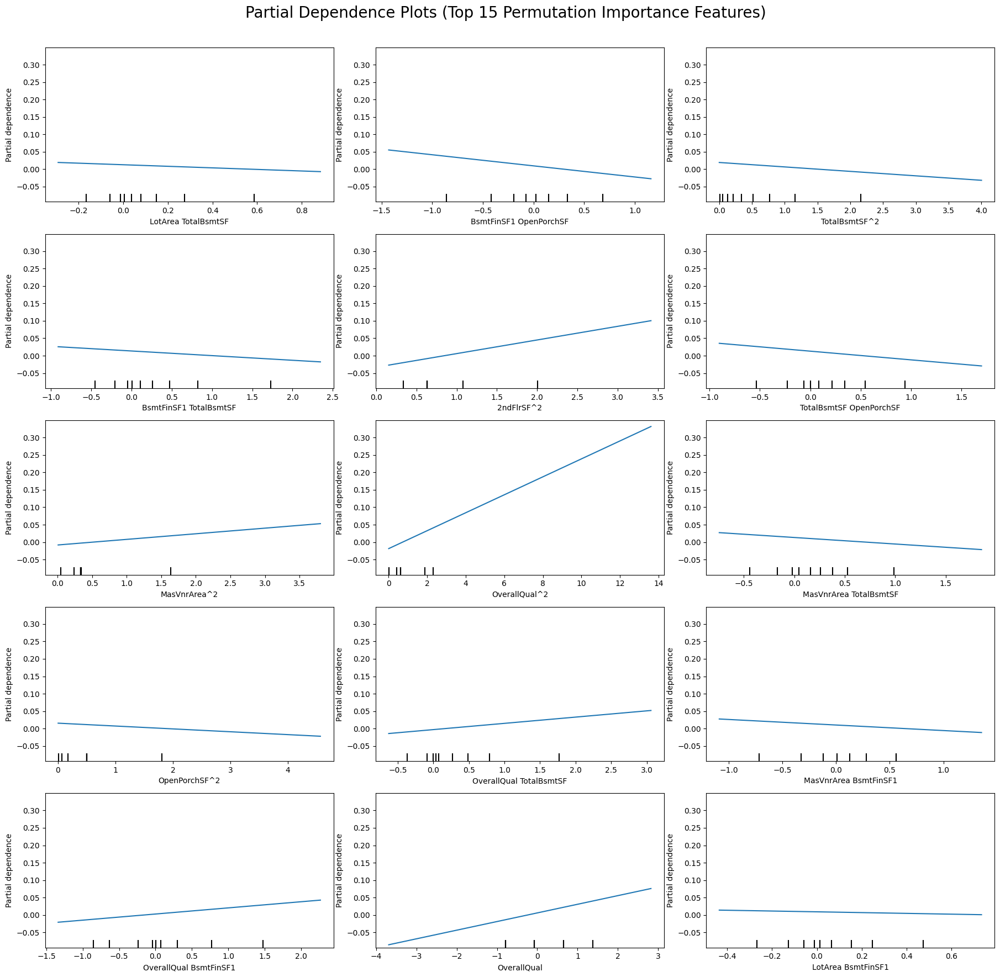

In [ ]:
# Get polynomial feature names (for plot labels)
feature_names_poly = poly2.get_feature_names_out(input_features=X_train_val.columns)
top15_features_perm = perm_top15_df['Feature'].tolist()

# Create subplot layout (5 rows × 3 columns = 15 subplots total)
fig, axs = plt.subplots(nrows=5, ncols=3, figsize=(18, 18))  # Larger figure size
axs = axs.flatten()  # Flatten to 1D array for easy iteration

# Generate PDP plots (manually pass ax handles)
PartialDependenceDisplay.from_estimator(
    best_model_poly2andRidge,
    X_train_poly2andRidge,
    features=top15_features_perm,
    feature_names=feature_names_poly,
    grid_resolution=50,
    ax=axs
)

plt.suptitle("Partial Dependence Plots (Top 15 Permutation Importance Features)", fontsize=20)
plt.tight_layout(rect=[0, 0, 1, 0.97])  # Leave space for the main title
plt.show()

### Slpine Model with 10 knots VS Slpine with Ridge

Spline Model with 10 knots
$$
\mathcal{L}(\boldsymbol{\beta}) = \frac{1}{2n} \sum_{i=1}^{n}
\left( y^{(i)} - \beta_0 - \sum_{j=1}^{p} \left[ \beta_j x_j^{(i)} + \sum_{k=1}^{K} \gamma_{jk} \, (x_j^{(i)} - t_k)^3_+ \right] \right)^2
$$

In [ ]:
# === Build cubic spline regression model (n_knots=10) ===
spline_model = make_pipeline(
    SplineTransformer(degree=3, n_knots=10, include_bias=False),
    LinearRegression()
)

# Fit the model
spline_model.fit(X_train_val, y_train_val)

# Training set prediction and evaluation
y_train_pred_spline = spline_model.predict(X_train_val)
mse_train_spline = mean_squared_error(y_train_val, y_train_pred_spline)
mae_train_spline = mean_absolute_error(y_train_val, y_train_pred_spline)
r2_train_spline = r2_score(y_train_val, y_train_pred_spline)
adj_r2_train_spline = 1 - (1 - r2_train_spline) * (len(y_train_val) - 1) / (len(y_train_val) - X_train_val.shape[1] - 1)

# Test set prediction and evaluation
y_test_pred_spline = spline_model.predict(X_test)
mse_test_spline = mean_squared_error(y_test, y_test_pred_spline)
mae_test_spline = mean_absolute_error(y_test, y_test_pred_spline)
r2_test_spline = r2_score(y_test, y_test_pred_spline)
adj_r2_test_spline = 1 - (1 - r2_test_spline) * (len(y_test) - 1) / (len(y_test) - X_test.shape[1] - 1)

# === Print evaluation results ===
print("===== Spline Regression Performance Summary (n_knots = 10) =====")
print("\n--- Training Set ---")
print(f"Mean Squared Error (MSE): {mse_train_spline:.4f}")
print(f"Mean Absolute Error (MAE): {mae_train_spline:.4f}")
print(f"R² Score: {r2_train_spline:.4f}")
print(f"Adjusted R² Score: {adj_r2_train_spline:.4f}")

print("\n--- Test Set ---")
print(f"Mean Squared Error (MSE): {mse_test_spline:.4f}")
print(f"Mean Absolute Error (MAE): {mae_test_spline:.4f}")
print(f"R² Score: {r2_test_spline:.4f}")
print(f"Adjusted R² Score: {adj_r2_test_spline:.4f}")

===== Spline Regression Performance Summary (n_knots = 10) =====

--- Training Set ---
Mean Squared Error (MSE): 0.0399
Mean Absolute Error (MAE): 0.1397
R² Score: 0.9578
Adjusted R² Score: 0.9548

--- Test Set ---
Mean Squared Error (MSE): 1.2797
Mean Absolute Error (MAE): 0.3769
R² Score: -0.0522
Adjusted R² Score: -0.4308


Spline Regression with 10 knots and Ridge
$$
\mathcal{L}(\boldsymbol{\beta}, \boldsymbol{\gamma}) = \frac{1}{2n} \sum_{i=1}^{n}
\left( y^{(i)} - \beta_0 - \sum_{j=1}^{p} \left[ \beta_j x_j^{(i)} + \sum_{k=1}^{K} \gamma_{jk} \, (x_j^{(i)} - t_k)^3_+ \right] \right)^2
+ \lambda \left( \sum_{j=1}^{p} \beta_j^2 + \sum_{j=1}^{p} \sum_{k=1}^{K} \gamma_{jk}^2 \right)
$$

===== Spline Regression Performance Summary (n_knots = 10) =====
Best Lambda (λ): 4.0826

--- Training Set ---
Mean Squared Error (MSE): 0.0763
Mean Absolute Error (MAE): 0.1785
R² Score: 0.9193
Adjusted R² Score: 0.9136

--- Test Set ---
Mean Squared Error (MSE): 0.1374
Mean Absolute Error (MAE): 0.2367
R² Score: 0.8870
Adjusted R² Score: 0.8463


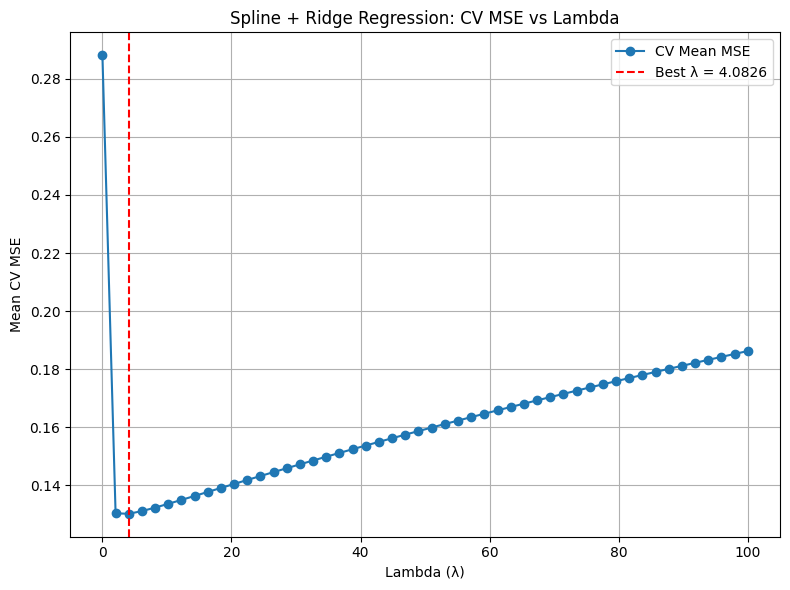

In [ ]:
# === Construct spline features ===
spline_transformer = SplineTransformer(degree=3, n_knots=10, include_bias=False)

# === Build pipeline with Ridge regression ===
ridge_model = Ridge()
lambdas_splineandRidge = np.linspace(0.001, 100, 50)
param_grid_splineandRidge = {'ridge__alpha': lambdas_splineandRidge}
splineandRidge_pipeline = make_pipeline(spline_transformer, ridge_model)

# === Use GridSearchCV to find the best lambda ===
grid_search_splineandRidge = GridSearchCV(
    splineandRidge_pipeline,
    param_grid=param_grid_splineandRidge,
    cv=5,
    scoring='neg_mean_squared_error',
    return_train_score=True
)
grid_search_splineandRidge.fit(X_train_val, y_train_val)

# === Get best model and best lambda ===
best_lambda_splineandRidge = grid_search_splineandRidge.best_params_['ridge__alpha']
best_model_splineandRidge = grid_search_splineandRidge.best_estimator_

# === Model evaluation ===
# Training set
y_train_pred_splineandRidge = best_model_splineandRidge.predict(X_train_val)
mse_train_splineandRidge = mean_squared_error(y_train_val, y_train_pred_splineandRidge)
mae_train_splineandRidge = mean_absolute_error(y_train_val, y_train_pred_splineandRidge)
r2_train_splineandRidge = r2_score(y_train_val, y_train_pred_splineandRidge)
adj_r2_train_splineandRidge = 1 - (1 - r2_train_splineandRidge) * (len(y_train_val) - 1) / (len(y_train_val) - X_train_val.shape[1] - 1)

# Test set
y_test_pred_splineandRidge = best_model_splineandRidge.predict(X_test)
mse_test_splineandRidge = mean_squared_error(y_test, y_test_pred_splineandRidge)
mae_test_splineandRidge = mean_absolute_error(y_test, y_test_pred_splineandRidge)
r2_test_splineandRidge = r2_score(y_test, y_test_pred_splineandRidge)
adj_r2_test_splineandRidge = 1 - (1 - r2_test_splineandRidge) * (len(y_test) - 1) / (len(y_test) - X_test.shape[1] - 1)

# === Print evaluation results ===
print("===== Spline Regression Performance Summary (n_knots = 10) =====")
print(f"Best Lambda (λ): {best_lambda_splineandRidge:.4f}")
print("\n--- Training Set ---")
print(f"Mean Squared Error (MSE): {mse_train_splineandRidge:.4f}")
print(f"Mean Absolute Error (MAE): {mae_train_splineandRidge:.4f}")
print(f"R² Score: {r2_train_splineandRidge:.4f}")
print(f"Adjusted R² Score: {adj_r2_train_splineandRidge:.4f}")

print("\n--- Test Set ---")
print(f"Mean Squared Error (MSE): {mse_test_splineandRidge:.4f}")
print(f"Mean Absolute Error (MAE): {mae_test_splineandRidge:.4f}")
print(f"R² Score: {r2_test_splineandRidge:.4f}")
print(f"Adjusted R² Score: {adj_r2_test_splineandRidge:.4f}")

# === Plot: lambda vs CV MSE ===
cv_results_splineandRidge = grid_search_splineandRidge.cv_results_
mean_cv_mse_splineandRidge = -cv_results_splineandRidge['mean_test_score']

plt.figure(figsize=(8, 6))
plt.plot(lambdas_splineandRidge, mean_cv_mse_splineandRidge, marker='o', label='CV Mean MSE')
plt.axvline(best_lambda_splineandRidge, color='red', linestyle='--', label=f'Best λ = {best_lambda_splineandRidge:.4f}')
plt.xlabel('Lambda (λ)')
plt.ylabel('Mean CV MSE')
plt.title('Spline + Ridge Regression: CV MSE vs Lambda')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

### Model Comparison

In [ ]:
train_results = pd.DataFrame({
    "Model": [
        "Linear Regression",
        "Lasso Regression",
        "Ridge Regression",
        "Polynomial Regression (Degree = 2)",
        "Polynomial + Ridge",
        "Spline Regression",
        "Spline + Ridge"
    ],
    "MSE": [
        mse_train_lr,
        mse_train_lasso,
        mse_train_ridge,
        mse_train_poly2,
        mse_train_poly2andRidge,
        mse_train_spline,
        mse_train_splineandRidge
    ],
    "MAE": [
        mae_train_lr,
        mae_train_lasso,
        mae_train_ridge,
        mae_train_poly2,
        mae_train_poly2andRidge,
        mae_train_spline,
        mae_train_splineandRidge
    ],
    "R²": [
        r2_train_lr,
        r2_train_lasso,
        r2_train_ridge,
        r2_train_poly2,
        r2_train_poly2andRidge,
        r2_train_spline,
        r2_train_splineandRidge
    ],
    "Adjusted R²": [
        adj_r2_train_lr,
        adj_r2_train_lasso,
        adj_r2_train_ridge,
        adj_r2_train_poly2,
        adj_r2_train_poly2andRidge,
        adj_r2_train_spline,
        adj_r2_train_splineandRidge
    ]
})

test_results = pd.DataFrame({
    "Model": [
        "Linear Regression",
        "Lasso Regression",
        "Ridge Regression",
        "Polynomial Regression (Degree = 2)",
        "Polynomial + Ridge",
        "Spline Regression",
        "Spline + Ridge"
    ],
    "MSE": [
        mse_test_lr,
        mse_test_lasso,
        mse_test_ridge,
        mse_test_poly2,
        mse_test_poly2andRidge,
        mse_test_spline,
        mse_test_splineandRidge
    ],
    "MAE": [
        mae_test_lr,
        mae_test_lasso,
        mae_test_ridge,
        mae_test_poly2,
        mae_test_poly2andRidge,
        mae_test_spline,
        mae_test_splineandRidge
    ],
    "R²": [
        r2_test_lr,
        r2_test_lasso,
        r2_test_ridge,
        r2_test_poly2,
        r2_test_poly2andRidge,
        r2_test_spline,
        r2_test_splineandRidge
    ],
    "Adjusted R²": [
        adj_r2_test_lr,
        adj_r2_test_lasso,
        adj_r2_test_ridge,
        adj_r2_test_poly2,
        adj_r2_test_poly2andRidge,
        adj_r2_test_spline,
        adj_r2_test_splineandRidge
    ]
})

from IPython.display import display
display(train_results)
display(test_results)

,Model,MSE,MAE,R²,Adjusted R²
0,Linear Regression,1.243633e-01,2.157118e-01,0.868501,0.859212
1,Lasso Regression,1.249094e-01,2.143314e-01,0.867923,0.858593
2,Ridge Regression,1.250246e-01,2.146948e-01,0.867802,0.858463
3,Polynomial Regression (Degree = 2),1.950783e-29,3.073170e-15,1.000000,1.000000
4,Polynomial + Ridge,3.142266e-02,1.215070e-01,0.966774,1.020269
5,Spline Regression,3.990915e-02,1.396834e-01,0.957801,0.954820
6,Spline + Ridge,7.631612e-02,1.784796e-01,0.919305,0.913604


,Model,MSE,MAE,R²,Adjusted R²
0,Linear Regression,0.161059,0.237254,0.867572,0.819923
1,Lasso Regression,0.162451,0.236020,0.866427,0.818366
2,Ridge Regression,0.160670,0.235017,0.867892,0.820358
3,Polynomial Regression (Degree = 2),0.254164,0.350611,0.791018,1.021805
4,Polynomial + Ridge,0.127976,0.226484,0.894774,1.010979
5,Spline Regression,1.279719,0.376922,-0.052226,-0.430831
6,Spline + Ridge,0.137450,0.236737,0.886984,0.846320


## Decision Trees and Random Forest

### Decision Trees

A simple tree with default settings

In [ ]:
# Initialize decision tree model
tree_model = DecisionTreeRegressor(random_state=42)
tree_model.fit(X_train_val, y_train_val)

# Training set evaluation
y_train_pred_tree = tree_model.predict(X_train_val)
mse_train_tree = mean_squared_error(y_train_val, y_train_pred_tree)
mae_train_tree = mean_absolute_error(y_train_val, y_train_pred_tree)
r2_train_tree = r2_score(y_train_val, y_train_pred_tree)
adj_r2_train_tree = 1 - (1 - r2_train_tree) * (len(y_train_val) - 1) / (len(y_train_val) - X_train_val.shape[1] - 1)

# Test set evaluation
y_test_pred_tree = tree_model.predict(X_test)
mse_test_tree = mean_squared_error(y_test, y_test_pred_tree)
mae_test_tree = mean_absolute_error(y_test, y_test_pred_tree)
r2_test_tree = r2_score(y_test, y_test_pred_tree)
adj_r2_test_tree = 1 - (1 - r2_test_tree) * (len(y_test) - 1) / (len(y_test) - X_test.shape[1] - 1)

# Print results
print("===== Decision Tree Regression Performance Summary =====")

print("\n--- Training Set ---")
print(f"Mean Squared Error (MSE): {mse_train_tree:.4f}")
print(f"Mean Absolute Error (MAE): {mae_train_tree:.4f}")
print(f"R² Score: {r2_train_tree:.4f}")
print(f"Adjusted R² Score: {adj_r2_train_tree:.4f}")

print("\n--- Test Set ---")
print(f"Mean Squared Error (MSE): {mse_test_tree:.4f}")
print(f"Mean Absolute Error (MAE): {mae_test_tree:.4f}")
print(f"R² Score: {r2_test_tree:.4f}")
print(f"Adjusted R² Score: {adj_r2_test_tree:.4f}")


===== Decision Tree Regression Performance Summary =====

--- Training Set ---
Mean Squared Error (MSE): 0.0000
Mean Absolute Error (MAE): 0.0000
R² Score: 1.0000
Adjusted R² Score: 1.0000

--- Test Set ---
Mean Squared Error (MSE): 0.3067
Mean Absolute Error (MAE): 0.3585
R² Score: 0.7478
Adjusted R² Score: 0.6570


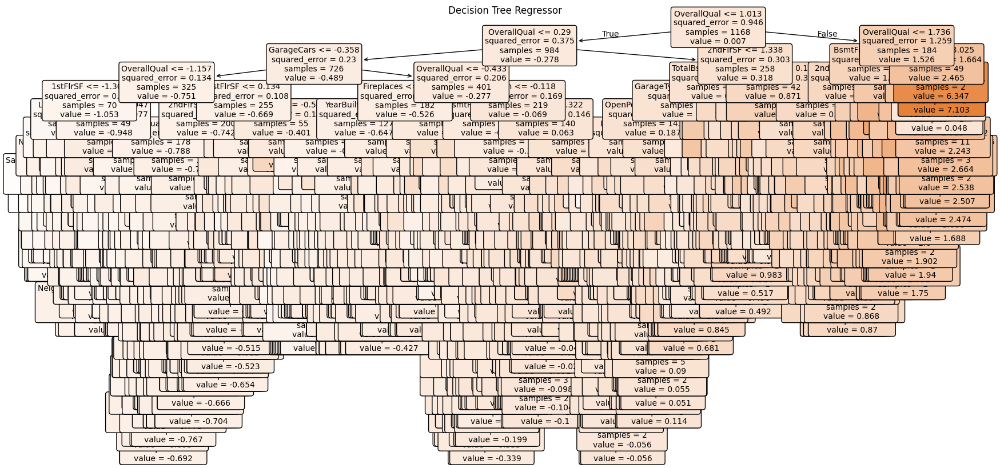

In [ ]:
# Visualize the decision tree
plt.figure(figsize=(20, 10))
plot_tree(
    tree_model,
    feature_names=X_train_val.columns if hasattr(X_train_val, "columns") else None,
    filled=True,
    rounded=True,
    fontsize=10
)
plt.title("Decision Tree Regressor")
plt.show()

In [ ]:
print("Tree depth:", tree_model.get_depth())
print("Number of leaf nodes:", tree_model.get_n_leaves())

Tree depth: 23
Number of leaf nodes: 1121


Cost-complexity pruning minimizes the objective function:   
$$
R_{\alpha}(T) = R(T) + \alpha \cdot |T|
$$

adjust tree with cv on max_depth and cost-complexity pruning parameter

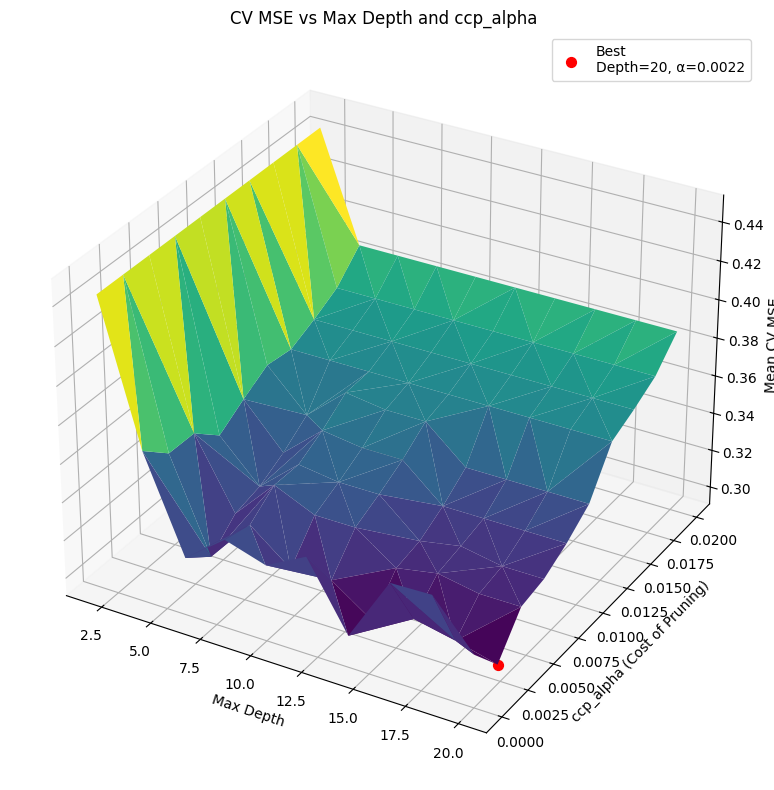

(20, np.float64(0.0022222222222222222), np.float64(0.30112080972056404))

In [ ]:
max_depths = range(2, 21, 2)
ccp_alphas = np.linspace(0.0, 0.02, 10)

depth_list = []
alpha_list = []
mse_list = []

# Grid search over combinations of max_depth and ccp_alpha
for depth in max_depths:
    for alpha in ccp_alphas:
        model = DecisionTreeRegressor(max_depth=depth, ccp_alpha=alpha, random_state=42)
        neg_mse_scores = cross_val_score(model, X_train_val, y_train_val, scoring='neg_mean_squared_error', cv=5)
        mean_mse = -np.mean(neg_mse_scores)
        depth_list.append(depth)
        alpha_list.append(alpha)
        mse_list.append(mean_mse)

# Find the best combination
min_idx = np.argmin(mse_list)
best_depth = depth_list[min_idx]
best_alpha = alpha_list[min_idx]
best_mse = mse_list[min_idx]

# 3D visualization
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')
trisurf = ax.plot_trisurf(depth_list, alpha_list, mse_list, cmap='viridis', edgecolor='none')
ax.scatter(best_depth, best_alpha, best_mse, color='red', s=50, label=f'Best\nDepth={best_depth}, α={best_alpha:.4f}')
ax.set_xlabel("Max Depth")
ax.set_ylabel("ccp_alpha (Cost of Pruning)")
ax.set_zlabel("Mean CV MSE")
ax.set_title("CV MSE vs Max Depth and ccp_alpha")
ax.legend()
plt.tight_layout()
plt.show()

best_depth, best_alpha, best_mse

In [ ]:
# Initialize the adjusted decision tree model
tree_model_adjusted = DecisionTreeRegressor(max_depth=8, ccp_alpha=0.0022, random_state=42)
tree_model_adjusted.fit(X_train_val, y_train_val)

# Training set evaluation
y_train_pred_tree_adjusted = tree_model_adjusted.predict(X_train_val)
mse_train_tree_adjusted = mean_squared_error(y_train_val, y_train_pred_tree_adjusted)
mae_train_tree_adjusted = mean_absolute_error(y_train_val, y_train_pred_tree_adjusted)
r2_train_tree_adjusted = r2_score(y_train_val, y_train_pred_tree_adjusted)
adj_r2_train_tree_adjusted = 1 - (1 - r2_train_tree_adjusted) * (len(y_train_val) - 1) / (len(y_train_val) - X_train_val.shape[1] - 1)

# Test set evaluation
y_test_pred_tree_adjusted = tree_model_adjusted.predict(X_test)
mse_test_tree_adjusted = mean_squared_error(y_test, y_test_pred_tree_adjusted)
mae_test_tree_adjusted = mean_absolute_error(y_test, y_test_pred_tree_adjusted)
r2_test_tree_adjusted = r2_score(y_test, y_test_pred_tree_adjusted)
adj_r2_test_tree_adjusted = 1 - (1 - r2_test_tree_adjusted) * (len(y_test) - 1) / (len(y_test) - X_test.shape[1] - 1)

# Print results
print("===== Adjusted Decision Tree Regression Performance Summary =====")

print("\n--- Training Set ---")
print(f"Mean Squared Error (MSE): {mse_train_tree_adjusted:.4f}")
print(f"Mean Absolute Error (MAE): {mae_train_tree_adjusted:.4f}")
print(f"R² Score: {r2_train_tree_adjusted:.4f}")
print(f"Adjusted R² Score: {adj_r2_train_tree_adjusted:.4f}")

print("\n--- Test Set ---")
print(f"Mean Squared Error (MSE): {mse_test_tree_adjusted:.4f}")
print(f"Mean Absolute Error (MAE): {mae_test_tree_adjusted:.4f}")
print(f"R² Score: {r2_test_tree_adjusted:.4f}")
print(f"Adjusted R² Score: {adj_r2_test_tree_adjusted:.4f}")

===== Adjusted Decision Tree Regression Performance Summary =====

--- Training Set ---
Mean Squared Error (MSE): 0.1168
Mean Absolute Error (MAE): 0.2586
R² Score: 0.8765
Adjusted R² Score: 0.8678

--- Test Set ---
Mean Squared Error (MSE): 0.2359
Mean Absolute Error (MAE): 0.3276
R² Score: 0.8060
Adjusted R² Score: 0.7362


$$
\Delta \text{MSE} = \text{MSE}_{\text{parent}} - \left( \frac{n_L}{n} \cdot \text{MSE}_L + \frac{n_R}{n} \cdot \text{MSE}_R \right)
$$

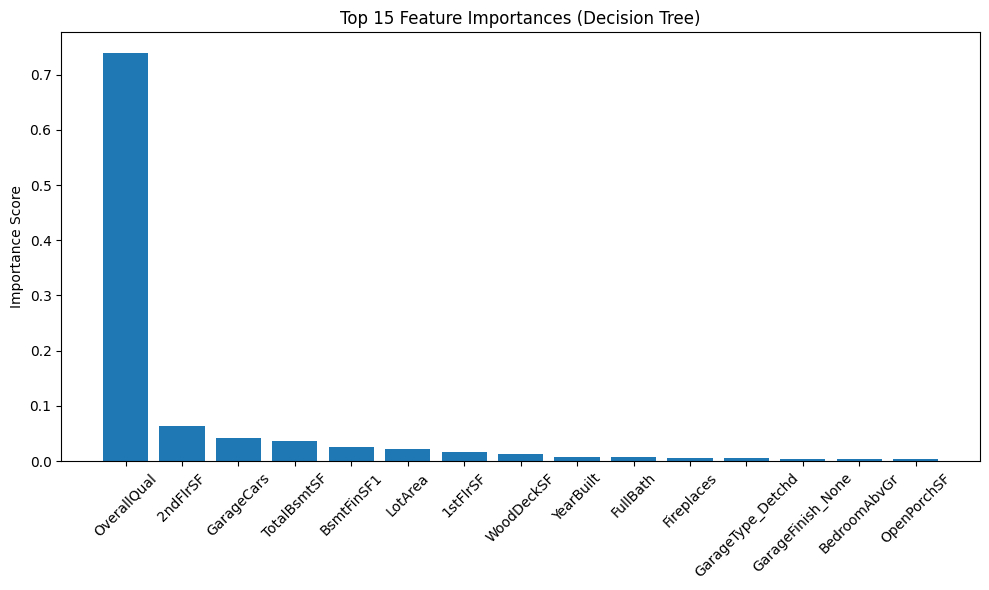

In [ ]:
# Get feature names
feature_names = X_train_val.columns if hasattr(X_train_val, 'columns') else [f"X{i}" for i in range(X_train_val.shape[1])]

# Get feature importances and sort them
importances = tree_model_adjusted.feature_importances_
indices = np.argsort(importances)[::-1]

# Select top 15 features
top_n = 15
top_indices = indices[:top_n]

# Visualize the top 15 features
plt.figure(figsize=(10, 6))
plt.bar(range(top_n), importances[top_indices], align='center')
plt.xticks(range(top_n), [feature_names[i] for i in top_indices], rotation=45)
plt.title("Top 15 Feature Importances (Decision Tree)")
plt.ylabel("Importance Score")
plt.tight_layout()
plt.show()

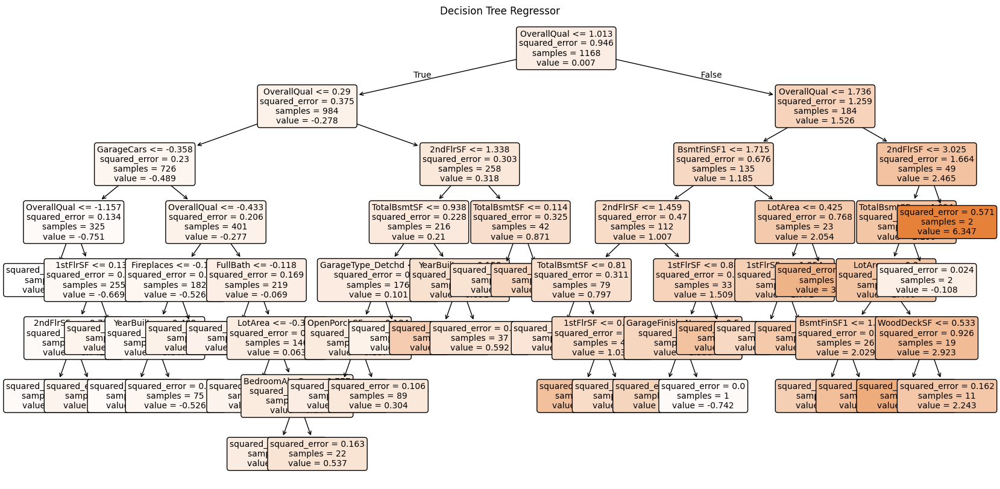

In [ ]:
plt.figure(figsize=(20, 10))
plot_tree(
    tree_model_adjusted,
    feature_names=X_train_val.columns if hasattr(X_train_val, "columns") else None,
    filled=True,
    rounded=True,
    fontsize=10
)
plt.title("Decision Tree Regressor")
plt.show()

Another way to do validation -- bootstrap.
max_depth and cost-complexity pruning parameter

100%|██████████| 10/10 [04:08<00:00, 24.81s/it]


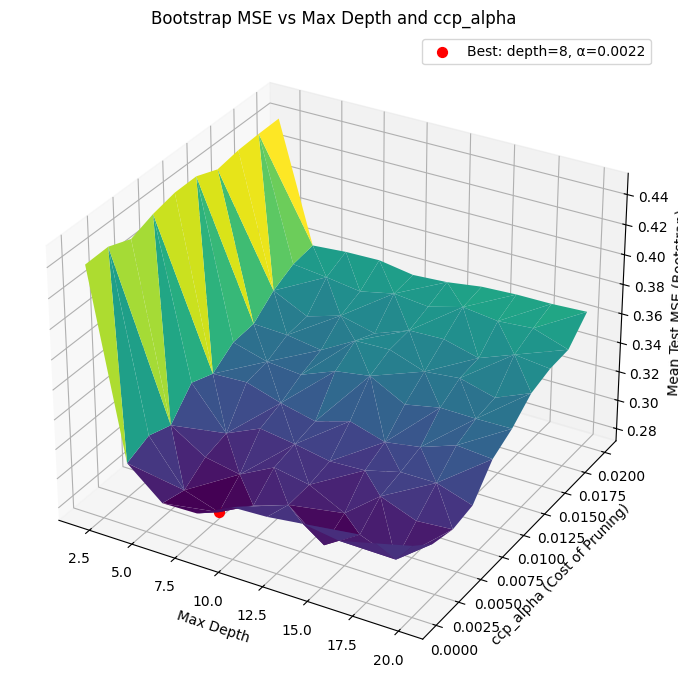

Best max_depth = 8, Best ccp_alpha = 0.0022, Mean MSE = 0.2830


In [ ]:
max_depths_adjusted2 = range(2, 21, 2)
ccp_alphas_adjusted2 = np.linspace(0.0, 0.02, 10)
n_bootstrap_adjusted2 = 100

results_adjusted2 = []

for depth_adjusted2 in tqdm(max_depths_adjusted2):
    for alpha_adjusted2 in ccp_alphas_adjusted2:
        mse_list_adjusted2 = []
        for _ in range(n_bootstrap_adjusted2):
            indices_adjusted2 = np.random.choice(len(X_train_val), size=len(X_train_val), replace=True)
            X_boot_adjusted2 = X_train_val.iloc[indices_adjusted2]
            y_boot_adjusted2 = y_train_val.iloc[indices_adjusted2]
            model_adjusted2 = DecisionTreeRegressor(max_depth=depth_adjusted2, ccp_alpha=alpha_adjusted2, random_state=42)
            model_adjusted2.fit(X_boot_adjusted2, y_boot_adjusted2)
            y_pred_adjusted2 = model_adjusted2.predict(X_test)
            mse_adjusted2 = mean_squared_error(y_test, y_pred_adjusted2)
            mse_list_adjusted2.append(mse_adjusted2)
        mean_mse_adjusted2 = np.mean(mse_list_adjusted2)
        results_adjusted2.append((depth_adjusted2, alpha_adjusted2, mean_mse_adjusted2))


depth_list_adjusted2, alpha_list_adjusted2, mse_list_adjusted2 = zip(*results_adjusted2)
depth_list_adjusted2 = np.array(depth_list_adjusted2)
alpha_list_adjusted2 = np.array(alpha_list_adjusted2)
mse_list_adjusted2 = np.array(mse_list_adjusted2)


best_index_adjusted2 = np.argmin(mse_list_adjusted2)
best_depth_adjusted2 = depth_list_adjusted2[best_index_adjusted2]
best_alpha_adjusted2 = alpha_list_adjusted2[best_index_adjusted2]
best_mse_adjusted2 = mse_list_adjusted2[best_index_adjusted2]

# plot
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_trisurf(depth_list_adjusted2, alpha_list_adjusted2, mse_list_adjusted2,
                       cmap='viridis', edgecolor='none')
ax.scatter(best_depth_adjusted2, best_alpha_adjusted2, best_mse_adjusted2,
           color='red', s=50, label=f"Best: depth={best_depth_adjusted2}, α={best_alpha_adjusted2:.4f}")
ax.set_xlabel("Max Depth")
ax.set_ylabel("ccp_alpha (Cost of Pruning)")
ax.set_zlabel("Mean Test MSE (Bootstrap)")
ax.set_title("Bootstrap MSE vs Max Depth and ccp_alpha")
ax.legend()
plt.tight_layout()
plt.show()


print(f"Best max_depth = {best_depth_adjusted2}, Best ccp_alpha = {best_alpha_adjusted2:.4f}, Mean MSE = {best_mse_adjusted2:.4f}")

In [ ]:
# model（adjusted2）
tree_model_adjusted2 = DecisionTreeRegressor(max_depth=10, ccp_alpha=0.0022, random_state=42)
tree_model_adjusted2.fit(X_train_val, y_train_val)

# train set
y_train_pred_tree_adjusted2 = tree_model_adjusted2.predict(X_train_val)
mse_train_tree_adjusted2 = mean_squared_error(y_train_val, y_train_pred_tree_adjusted2)
mae_train_tree_adjusted2 = mean_absolute_error(y_train_val, y_train_pred_tree_adjusted2)
r2_train_tree_adjusted2 = r2_score(y_train_val, y_train_pred_tree_adjusted2)
adj_r2_train_tree_adjusted2 = 1 - (1 - r2_train_tree_adjusted2) * (len(y_train_val) - 1) / (len(y_train_val) - X_train_val.shape[1] - 1)

# test set
y_test_pred_tree_adjusted2 = tree_model_adjusted2.predict(X_test)
mse_test_tree_adjusted2 = mean_squared_error(y_test, y_test_pred_tree_adjusted2)
mae_test_tree_adjusted2 = mean_absolute_error(y_test, y_test_pred_tree_adjusted2)
r2_test_tree_adjusted2 = r2_score(y_test, y_test_pred_tree_adjusted2)
adj_r2_test_tree_adjusted2 = 1 - (1 - r2_test_tree_adjusted2) * (len(y_test) - 1) / (len(y_test) - X_test.shape[1] - 1)

# print
print("===== Adjusted2 Decision Tree Regression Performance Summary =====")

print("\n--- Training Set ---")
print(f"Mean Squared Error (MSE): {mse_train_tree_adjusted2:.4f}")
print(f"Mean Absolute Error (MAE): {mae_train_tree_adjusted2:.4f}")
print(f"R² Score: {r2_train_tree_adjusted2:.4f}")
print(f"Adjusted R² Score: {adj_r2_train_tree_adjusted2:.4f}")

print("\n--- Test Set ---")
print(f"Mean Squared Error (MSE): {mse_test_tree_adjusted2:.4f}")
print(f"Mean Absolute Error (MAE): {mae_test_tree_adjusted2:.4f}")
print(f"R² Score: {r2_test_tree_adjusted2:.4f}")
print(f"Adjusted R² Score: {adj_r2_test_tree_adjusted2:.4f}")

===== Adjusted2 Decision Tree Regression Performance Summary =====

--- Training Set ---
Mean Squared Error (MSE): 0.1168
Mean Absolute Error (MAE): 0.2586
R² Score: 0.8765
Adjusted R² Score: 0.8678

--- Test Set ---
Mean Squared Error (MSE): 0.2550
Mean Absolute Error (MAE): 0.3350
R² Score: 0.7904
Adjusted R² Score: 0.7149


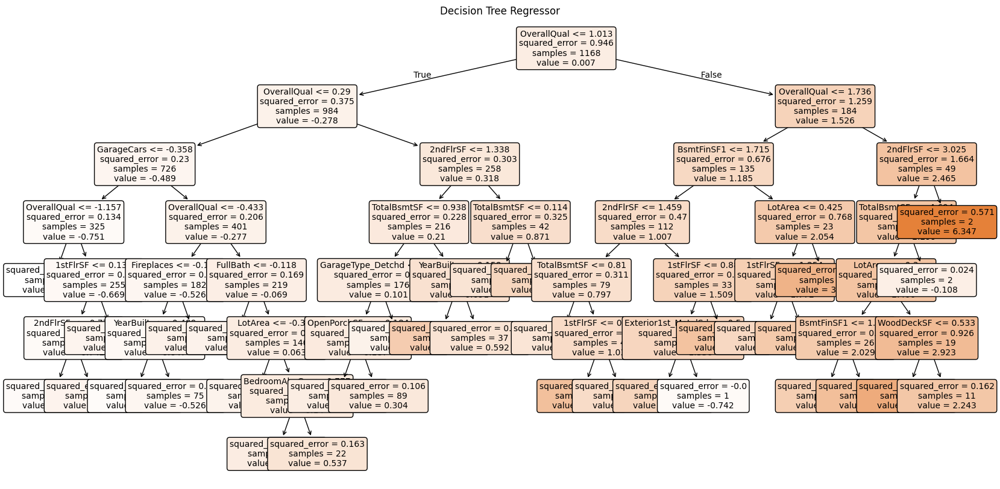

In [ ]:
plt.figure(figsize=(20, 10))
plot_tree(
    tree_model_adjusted2,
    feature_names=X_train_val.columns if hasattr(X_train_val, "columns") else None,
    filled=True,
    rounded=True,
    fontsize=10
)
plt.title("Decision Tree Regressor")
plt.show()

### Random Forest

Random Forest with default setting

In [ ]:
# Initialize the random forest model
rf_model = RandomForestRegressor(
    n_estimators=100,
    max_depth=None,
    random_state=42
)

# Train the model
rf_model.fit(X_train_val, y_train_val)

# Training set prediction and evaluation
y_train_pred_rf = rf_model.predict(X_train_val)
mse_train_rf = mean_squared_error(y_train_val, y_train_pred_rf)
mae_train_rf = mean_absolute_error(y_train_val, y_train_pred_rf)
r2_train_rf = r2_score(y_train_val, y_train_pred_rf)
adj_r2_train_rf = 1 - (1 - r2_train_rf) * (len(y_train_val) - 1) / (len(y_train_val) - X_train_val.shape[1] - 1)

# Test set prediction and evaluation
y_test_pred_rf = rf_model.predict(X_test)
mse_test_rf = mean_squared_error(y_test, y_test_pred_rf)
mae_test_rf = mean_absolute_error(y_test, y_test_pred_rf)
r2_test_rf = r2_score(y_test, y_test_pred_rf)
adj_r2_test_rf = 1 - (1 - r2_test_rf) * (len(y_test) - 1) / (len(y_test) - X_test.shape[1] - 1)

# Print results
print("===== Random Forest Regression Performance Summary =====")

print("\n--- Training Set ---")
print(f"Mean Squared Error (MSE): {mse_train_rf:.4f}")
print(f"Mean Absolute Error (MAE): {mae_train_rf:.4f}")
print(f"R² Score: {r2_train_rf:.4f}")
print(f"Adjusted R² Score: {adj_r2_train_rf:.4f}")

print("\n--- Test Set ---")
print(f"Mean Squared Error (MSE): {mse_test_rf:.4f}")
print(f"Mean Absolute Error (MAE): {mae_test_rf:.4f}")
print(f"R² Score: {r2_test_rf:.4f}")
print(f"Adjusted R² Score: {adj_r2_test_rf:.4f}")

===== Random Forest Regression Performance Summary =====

--- Training Set ---
Mean Squared Error (MSE): 0.0206
Mean Absolute Error (MAE): 0.0858
R² Score: 0.9783
Adjusted R² Score: 0.9767

--- Test Set ---
Mean Squared Error (MSE): 0.1324
Mean Absolute Error (MAE): 0.2277
R² Score: 0.8912
Adjusted R² Score: 0.8520


In [ ]:
# View the depth of all trees
rf_depths = [estimator.get_depth() for estimator in rf_model.estimators_]

# Print summary statistics
print(f"Number of trees: {len(rf_depths)}")
print(f"Max depth among all trees: {max(rf_depths)}")
print(f"Min depth among all trees: {min(rf_depths)}")
print(f"Average depth: {sum(rf_depths) / len(rf_depths):.2f}")

Number of trees: 100
Max depth among all trees: 26
Min depth among all trees: 18
Average depth: 21.54


By default,   
'n_estimators': 100   
'max_features': auto   
'max_depth': None,   
'min_samples_leaf': 1   

Fitting 3 folds for each of 192 candidates, totalling 576 fits
===== Best Random Forest (rf2) Performance Summary =====
Best Parameters: {'max_depth': 10, 'max_features': 0.3333333333333333, 'min_samples_leaf': 2, 'n_estimators': 150}

--- Training Set ---
MSE: 0.0373
MAE: 0.1186
R²: 0.9606
Adjusted R²: 0.9578

--- Test Set ---
MSE: 0.1268
MAE: 0.2201
R²: 0.8958
Adjusted R²: 0.8583


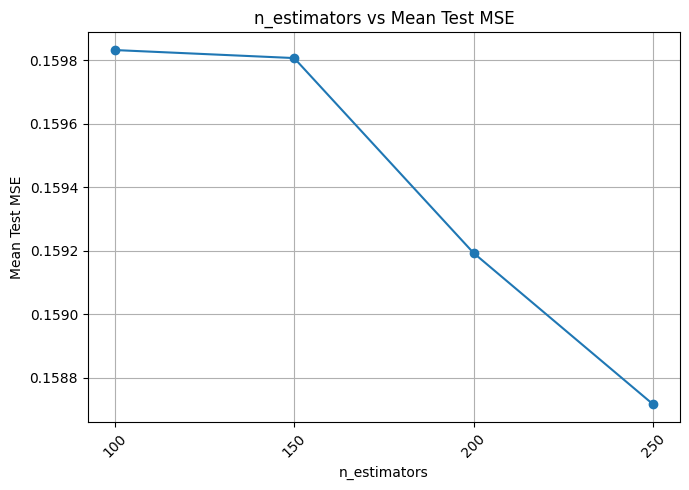

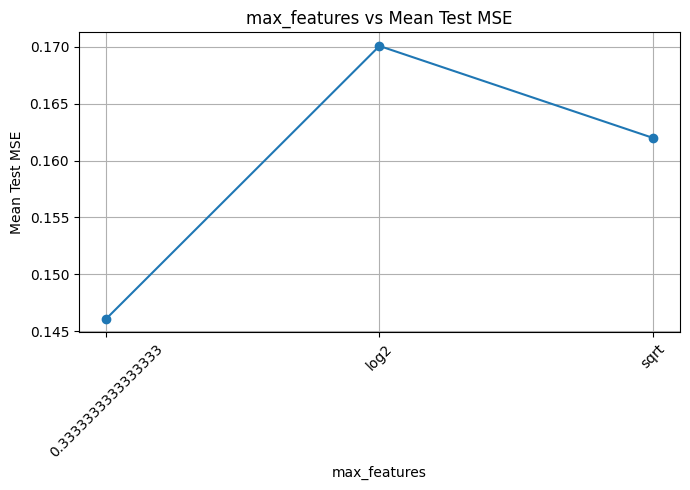

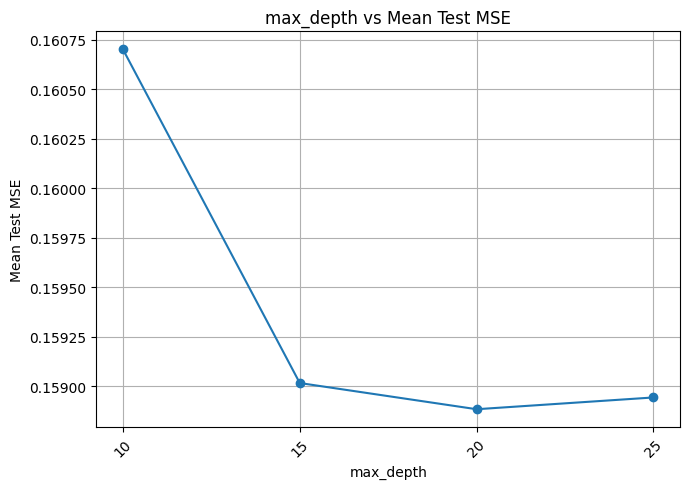

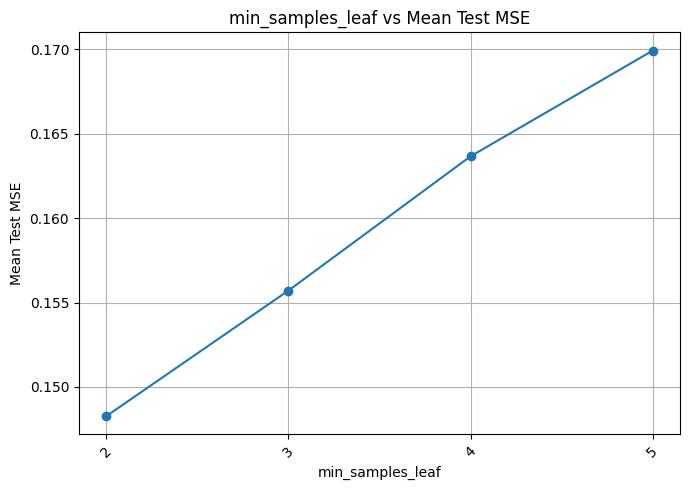

In [ ]:
# ====== Grid Search Parameter Grid ======
param_grid = {
    'n_estimators': [100, 150, 200, 250],
    'max_features': ['sqrt', 'log2', 1/3],
    'max_depth': [10, 15, 20, 25],
    'min_samples_leaf': [2, 3, 4, 5]
}

# ====== Execute Grid Search ======
grid_search = GridSearchCV(
    estimator=RandomForestRegressor(random_state=42),
    param_grid=param_grid,
    scoring='neg_mean_squared_error',  # The lower the MSE, the better
    cv=3,
    n_jobs=-1,
    verbose=1,
    return_train_score=True
)

grid_search.fit(X_train_val, y_train_val)
best_rf2 = grid_search.best_estimator_

# ====== Model Evaluation ======
y_train_pred_rf2 = best_rf2.predict(X_train_val)
mse_train_rf2 = mean_squared_error(y_train_val, y_train_pred_rf2)
mae_train_rf2 = mean_absolute_error(y_train_val, y_train_pred_rf2)
r2_train_rf2 = r2_score(y_train_val, y_train_pred_rf2)
adj_r2_train_rf2 = 1 - (1 - r2_train_rf2) * (len(y_train_val) - 1) / (len(y_train_val) - X_train_val.shape[1] - 1)

y_test_pred_rf2 = best_rf2.predict(X_test)
mse_test_rf2 = mean_squared_error(y_test, y_test_pred_rf2)
mae_test_rf2 = mean_absolute_error(y_test, y_test_pred_rf2)
r2_test_rf2 = r2_score(y_test, y_test_pred_rf2)
adj_r2_test_rf2 = 1 - (1 - r2_test_rf2) * (len(y_test) - 1) / (len(y_test) - X_test.shape[1] - 1)

# ====== Print Evaluation Results ======
print("===== Best Random Forest (rf2) Performance Summary =====")
print(f"Best Parameters: {grid_search.best_params_}")

print("\n--- Training Set ---")
print(f"MSE: {mse_train_rf2:.4f}")
print(f"MAE: {mae_train_rf2:.4f}")
print(f"R²: {r2_train_rf2:.4f}")
print(f"Adjusted R²: {adj_r2_train_rf2:.4f}")

print("\n--- Test Set ---")
print(f"MSE: {mse_test_rf2:.4f}")
print(f"MAE: {mae_test_rf2:.4f}")
print(f"R²: {r2_test_rf2:.4f}")
print(f"Adjusted R²: {adj_r2_test_rf2:.4f}")

# ====== Visualization: Relationship between Hyperparameters and MSE ======
cv_results = pd.DataFrame(grid_search.cv_results_)

for param in ['param_n_estimators', 'param_max_features', 'param_max_depth', 'param_min_samples_leaf']:
    plt.figure(figsize=(7, 5))
    grouped = cv_results.groupby(param)['mean_test_score'].mean()
    plt.plot(grouped.index.astype(str), -grouped.values, marker='o')
    plt.xlabel(param.replace('param_', ''))
    plt.ylabel("Mean Test MSE")
    plt.title(f"{param.replace('param_', '')} vs Mean Test MSE")
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

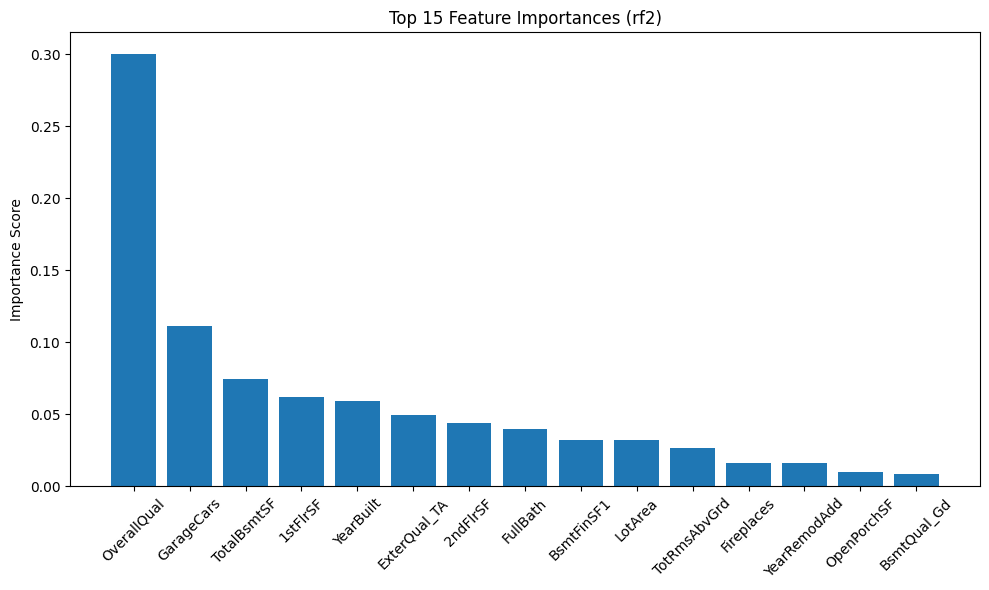

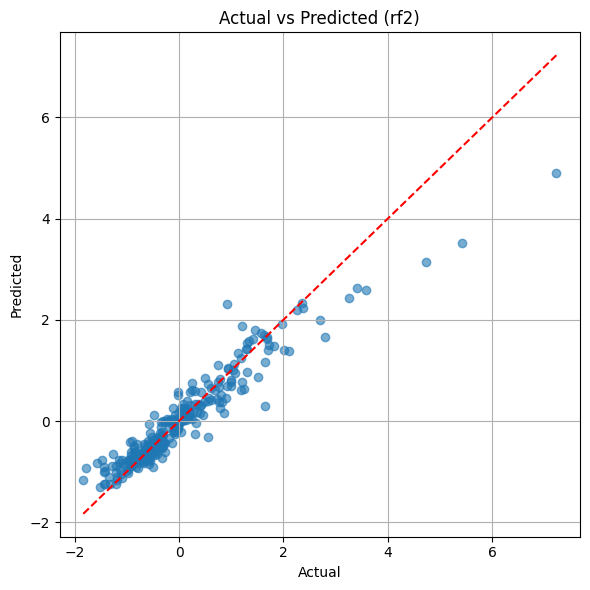

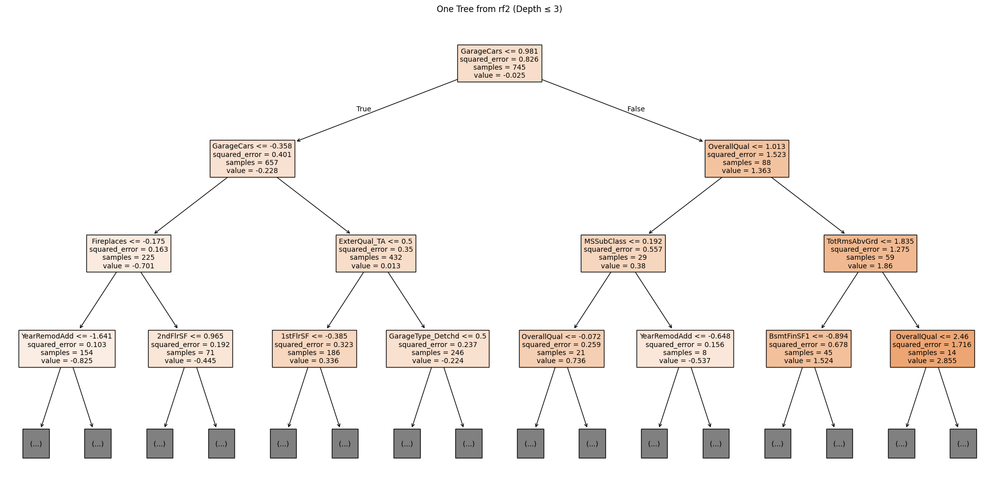

In [ ]:
# Get feature names
feature_names = X_train_val.columns if hasattr(X_train_val, "columns") else [f"X{i}" for i in range(X_train_val.shape[1])]

# ==== 1. Top 15 Feature Importances ====
importances = best_rf2.feature_importances_
indices = np.argsort(importances)[::-1][:15]  # Top 15

plt.figure(figsize=(10, 6))
plt.bar(range(15), importances[indices], align='center')
plt.xticks(range(15), [feature_names[i] for i in indices], rotation=45)
plt.title("Top 15 Feature Importances (rf2)")
plt.ylabel("Importance Score")
plt.tight_layout()
plt.show()

# ==== 2. Actual vs Predicted ====
plt.figure(figsize=(6, 6))
plt.scatter(y_test, y_test_pred_rf2, alpha=0.6)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel("Actual")
plt.ylabel("Predicted")
plt.title("Actual vs Predicted (rf2)")
plt.grid(True)
plt.tight_layout()
plt.show()

# ==== 3. Visualize One Tree (only first 3 levels) ====
plt.figure(figsize=(20, 10))
plot_tree(best_rf2.estimators_[0],  # The first tree in the forest
          feature_names=feature_names,
          filled=True,
          max_depth=3,
          fontsize=10)
plt.title("One Tree from rf2 (Depth ≤ 3)")
plt.tight_layout()
plt.show()

Top 15 Permutation Importances (rf2):
         Feature  Permutation Importance
0    OverallQual                0.230111
1     GarageCars                0.051004
2    TotalBsmtSF                0.044530
3       1stFlrSF                0.043367
4       2ndFlrSF                0.036333
5        LotArea                0.023914
6     BsmtFinSF1                0.023324
7   TotRmsAbvGrd                0.020765
8      YearBuilt                0.019965
9       FullBath                0.014828
10  ExterQual_TA                0.012989
11    Fireplaces                0.010451
12  YearRemodAdd                0.010256
13   OpenPorchSF                0.006398
14    MasVnrArea                0.004884


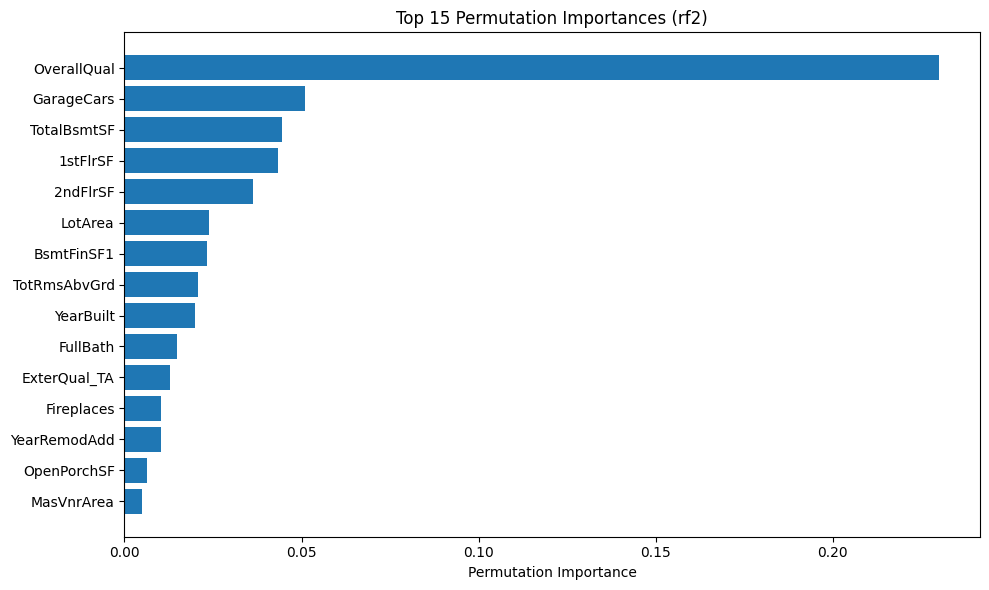

In [ ]:
# permutation importance
perm_result = permutation_importance(
    best_rf2,
    X_train_val,
    y_train_val,
    scoring='neg_mean_squared_error',
    n_repeats=10,
    random_state=42,
    n_jobs=-1
)

perm_importances = perm_result.importances_mean
indices_perm = np.argsort(perm_importances)[::-1][:15]

perm_top_features = pd.DataFrame({
    'Feature': [feature_names[i] for i in indices_perm],
    'Permutation Importance': perm_importances[indices_perm]
})

print("Top 15 Permutation Importances (rf2):")
print(perm_top_features)

plt.figure(figsize=(10, 6))
plt.barh(perm_top_features['Feature'], perm_top_features['Permutation Importance'])
plt.xlabel("Permutation Importance")
plt.title("Top 15 Permutation Importances (rf2)")
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()


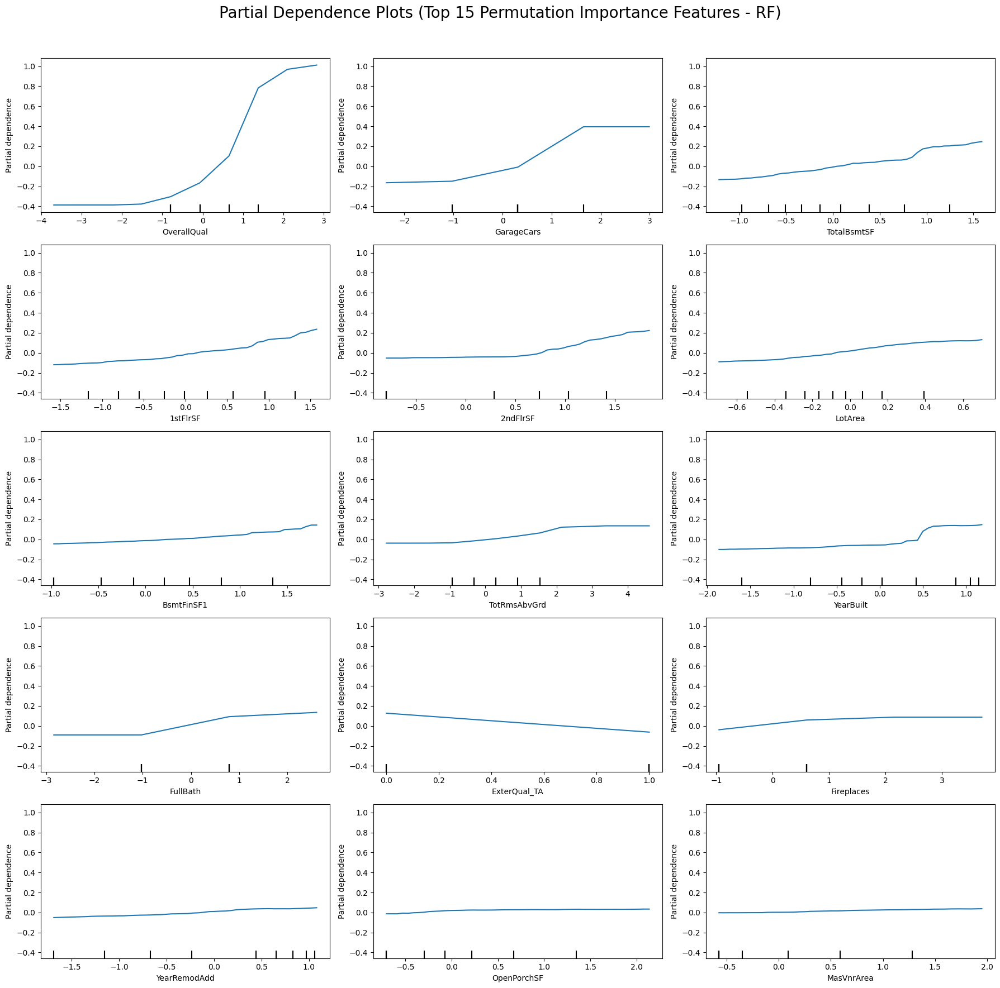

In [ ]:
# Get the top 15 features by permutation importance
perm_top_feature_names = [feature_names[i] for i in indices_perm]

# === Create a 5×3 subplot layout for 15 plots ===
fig, axs = plt.subplots(nrows=5, ncols=3, figsize=(18, 18))  # Enlarge the figure
axs = axs.flatten()  # Flatten to 1D for easier iteration

# === Plot Partial Dependence Plots (PDP) ===
PartialDependenceDisplay.from_estimator(
    best_rf2,
    X_train_val,
    features=perm_top_feature_names,
    feature_names=feature_names,
    grid_resolution=50,
    ax=axs
)

plt.suptitle("Partial Dependence Plots (Top 15 Permutation Importance Features - RF)", fontsize=20)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()